In [2]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import glob
import re
import umap.umap_ as umap
from tqdm.notebook import tqdm

In [3]:
import warnings
from sklearn.preprocessing import StandardScaler

In [4]:
#antigens = ['3VRL', '1NSN', '3RAJ', '5E94', '1H0D', '1WEJ', '1ADQ', '1FBI','2YPV', '1OB1']  
antigens = ['1NSN', '1ADQ']

In [5]:
def list_str(row):
    l_str = re.findall('-?\d.\d+',row)
    l_str = ','.join(l_str)
    return l_str

In [6]:
def get_X(series):
    X = series.apply(list_str)
    X = X.str.split(',', expand = True)
    X = np.array(X)
    return X

In [7]:
def ig_clustering(method, df, repl, clust_column): 
    
    df = df[df[f'repl_{repl}_pred'] == 1]
    value_count = df[clust_column].value_counts()
    labels = value_count[:3].keys()
    
    df = df[df[clust_column].isin(labels)]
    X = df[f'repl_{repl}_ig']
    X = get_X(X)
    X = StandardScaler().fit_transform(X)
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        if method == 'tsne':
            reducer = TSNE()
        elif method == 'umap':
            reducer = umap.UMAP()
        elif method == 'pca':
            reducer = PCA()
        res = reducer.fit_transform(X)
        
        if method == 'pca':
            res = res[:, :2]
        res_df = pd.DataFrame(res, columns = ['ax1', 'ax2'])
        
        res_df[clust_column] = df[clust_column]
        print(f'Antigen {ag} \n {value_count[:3]}')
        sns.scatterplot(res_df, x='ax1' , y='ax2', hue= clust_column, legend=True)
        plt.show()

In [13]:
def get_best_repl(perf_file_name):
    df_perf = pd.read_csv(f'./closed_open_performance/{perf_file_name}', index_col = 0)
    df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
    best_repls = df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
    return best_repls

In [9]:
def merge_ig_ag_ab_info(ig_file_type, ag):
    df_ig_pred = pd.read_csv(f'./IG/{ag}_{ig_file_type}.txt', sep='\t', index_col = 0)
    path_epi = glob.glob(f'../data/Slide_importance/{ag}_[A-Z]_Task4_Slice_ParaEpi.txt')[0]
    para_epi = pd.read_csv(path_epi, sep='\t')
    df_ig_ab_info = df_ig_pred.merge(para_epi, on=['Slide', 'Label', 'seqABParatope', 'AAcompoFullSlice'])
    return df_ig_ab_info

# Check alignment with Epitope seq

1ADQ swa_high_looser_0.05b_ig
t-SNE
Antigen 1ADQ 
 P1V1F1V3D3V1S1Q2Q1V1T1K1P1E1Y1R2V1V1        2363
L1R1P1W1V1D2V1Q1V1A1K1T1V1L1H1Q3N1W1L1Y1    1523
S1W1V1D1V2Q1V3N1A1K1T2V1L2H1N1Y1             740
Name: seqAGEpitope, dtype: int64


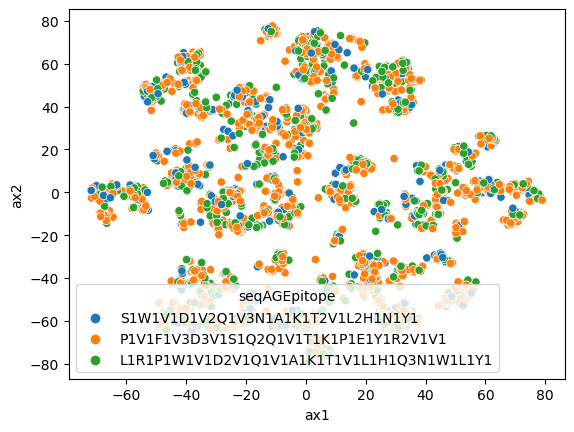

In [15]:
ig_file_type = 'swa_high_looser_0.05b_ig'
perf_file_name = 'looser_full_perf.csv'
best_repls = get_best_repl(perf_file_name)
    
for ag in ['1ADQ']:
    best_repl_ag = int(best_repls.loc[ag]['repl'])
    df_ig_ab_info = merge_ig_ag_ab_info(ig_file_type, ag)
    print(f'{ag} {ig_file_type}')
    print('t-SNE')
    ig_clustering('tsne', df_ig_ab_info, best_repl_ag, 'seqAGEpitope')
    

1ADQ swa_high_looser_0.05b_ig
t-SNE
Antigen 1ADQ 
 P1V1F1V3D3V1S1Q2Q1V1T1K1P1E1Y1R2V1V1        2363
L1R1P1W1V1D2V1Q1V1A1K1T1V1L1H1Q3N1W1L1Y1    1523
S1W1V1D1V2Q1V3N1A1K1T2V1L2H1N1Y1             740
Name: seqAGEpitope, dtype: int64


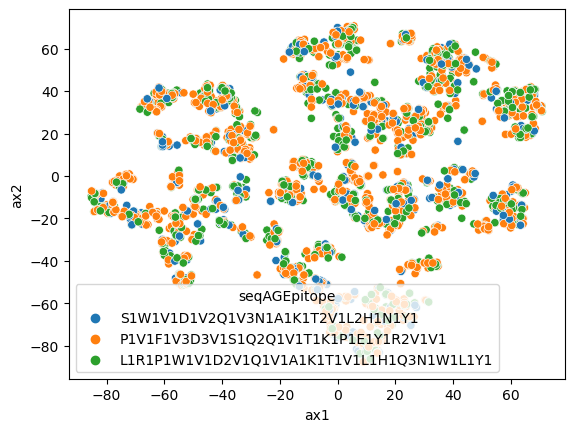

UMAP
Antigen 1ADQ 
 P1V1F1V3D3V1S1Q2Q1V1T1K1P1E1Y1R2V1V1        2363
L1R1P1W1V1D2V1Q1V1A1K1T1V1L1H1Q3N1W1L1Y1    1523
S1W1V1D1V2Q1V3N1A1K1T2V1L2H1N1Y1             740
Name: seqAGEpitope, dtype: int64


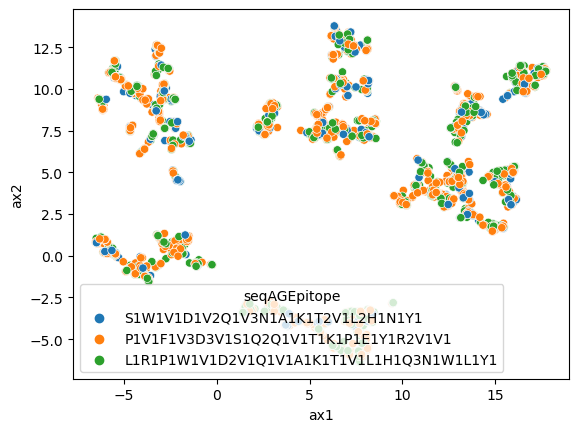

1NSN swa_high_looser_0.05b_ig
t-SNE
Antigen 1NSN 
 I1D1T1V1K1M1T1V1T1Q1D1Y1G1R4G1V2Y1V2N1          3908
I1K1I2D1T1V1K1P1M1T1V1T1Q1D1K1Y1G1R3G1V1V1N1    1828
I1K1I2D2D1T1V1K1P1M1T1V1T2E1H1Y1G1R1V1           487
Name: seqAGEpitope, dtype: int64


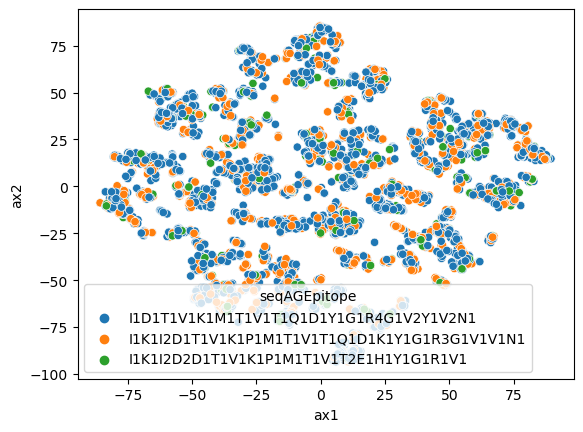

UMAP
Antigen 1NSN 
 I1D1T1V1K1M1T1V1T1Q1D1Y1G1R4G1V2Y1V2N1          3908
I1K1I2D1T1V1K1P1M1T1V1T1Q1D1K1Y1G1R3G1V1V1N1    1828
I1K1I2D2D1T1V1K1P1M1T1V1T2E1H1Y1G1R1V1           487
Name: seqAGEpitope, dtype: int64


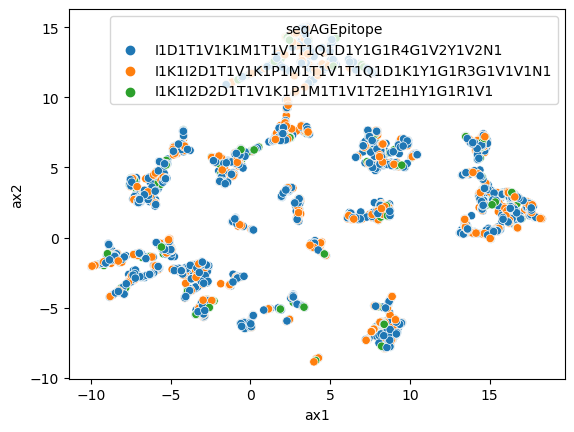

In [16]:
ig_file_type = 'swa_high_looser_0.05b_ig'
perf_file_name = 'looser_full_perf.csv'
best_repls = get_best_repl(perf_file_name)
    
for ag in ['1ADQ', '1NSN']:
    best_repl_ag = int(best_repls.loc[ag]['repl'])
    df_ig_ab_info = merge_ig_ag_ab_info(ig_file_type, ag)
    print(f'{ag} {ig_file_type}')
    print('t-SNE')
    ig_clustering('tsne', df_ig_ab_info, best_repl_ag, 'seqAGEpitope')
    print('UMAP')
    ig_clustering('umap', df_ig_ab_info, best_repl_ag, 'seqAGEpitope')

1ADQ swa_high_low_0.05b_ig
t-SNE
Antigen 1ADQ 
 P1V1F1V3D3V1S1Q2Q1V1T1K1P1E1Y1R2V1V1        2496
L1R1P1W1V1D2V1Q1V1A1K1T1V1L1H1Q3N1W1L1Y1    1600
S1W1V1D1V2Q1V3N1A1K1T2V1L2H1N1Y1            1142
Name: seqAGEpitope, dtype: int64


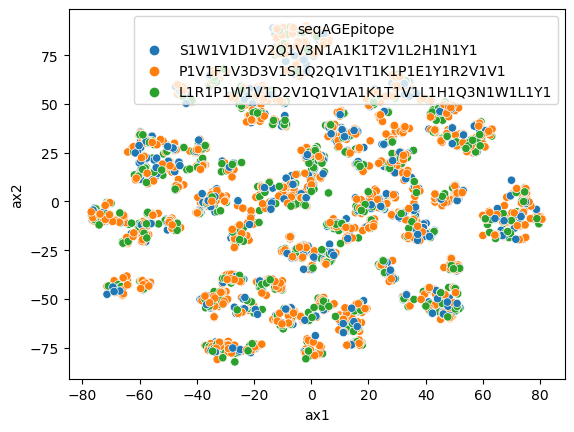

In [224]:
ig_file_type = 'swa_high_low_0.05b_ig'
perf_file_name = 'low95_full_perf.csv'
best_repls = get_best_repl(perf_file_name)
    
for ag in ['1ADQ']:
    best_repl_ag = int(best_repls.loc[ag]['repl'])
    df_ig_ab_info = merge_ig_ag_ab_info(ig_file_type, ag)
    print(f'{ag} {ig_file_type}')
    print('t-SNE')
    ig_clustering('tsne', df_ig_ab_info, best_repl_ag, 'seqAGEpitope')
    #print('UMAP')
    #ig_clustering('umap', df_ig_ab_info, best_repl_ag, 'seqAGEpitope')

1ADQ swa_1_vs_all_0.05b_ig
t-SNE
Antigen 1ADQ 
 P1V1F1V3D3V1S1Q2Q1V1T1K1P1E1Y1R2V1V1        2449
L1R1P1W1V1D2V1Q1V1A1K1T1V1L1H1Q3N1W1L1Y1    1569
S1W1V1D1V2Q1V3N1A1K1T2V1L2H1N1Y1             869
Name: seqAGEpitope, dtype: int64


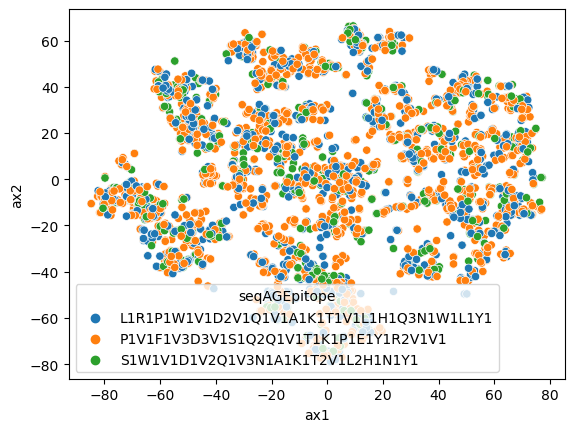

In [226]:
ig_file_type = 'swa_1_vs_all_0.05b_ig'
perf_file_name = 'one_all_full_perf.csv'
best_repls = get_best_repl(perf_file_name)
    
for ag in ['1ADQ']:
    best_repl_ag = int(best_repls.loc[ag]['repl'])
    df_ig_ab_info = merge_ig_ag_ab_info(ig_file_type, ag)
    print(f'{ag} {ig_file_type}')
    print('t-SNE')
    ig_clustering('tsne', df_ig_ab_info, best_repl_ag, 'seqAGEpitope')
    #print('UMAP')
    #ig_clustering('umap', df_ig_ab_info, best_repl_ag, 'seqAGEpitope')

In [ ]:
"""converter = {f"1_vs_all_repl_{d}_ig": pd.eval for d in range(1,11)}
ig_file_type = 'base_1_vs_all_0b_ig'
perf_file_name = 'one_all_full_perf.csv'
best_repls = get_best_repl(perf_file_name)
    
for ag in antigens:
    best_repl_ag = int(best_repls.loc[ag]['repl'])
    df_ig_ab_info = merge_ig_ag_ab_info(ig_file_type, ag)
    print(f'{ag} {ig_file_type}')
    print('t-SNE')
    ig_clustering('tsne', df_ig_ab_info, best_repl_ag, 'seqAGEpitope')
    print('UMAP')
    ig_clustering('umap', df_ig_ab_info, best_repl_ag, 'seqAGEpitope')"""

# Check alignment with paratope motif

1ADQ swa_high_looser_0.05b_ig
t-SNE
Antigen 1ADQ 
 X2X3--X2X1X3X1X4X1X4X3*    1402
X2X3X4X3X1X1X1X1X2X1X4*    1356
X1X4X1X4X3X3X1X2--X3X2*     654
Name: motifABParatope, dtype: int64


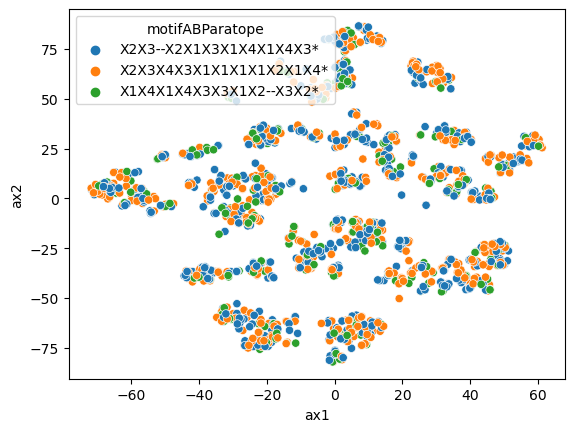

In [227]:
ig_file_type = 'swa_high_looser_0.05b_ig'
perf_file_name = 'looser_full_perf.csv'
best_repls = get_best_repl(perf_file_name)
    
for ag in ['1ADQ']:
    best_repl_ag = int(best_repls.loc[ag]['repl'])
    df_ig_ab_info = merge_ig_ag_ab_info(ig_file_type, ag)
    print(f'{ag} {ig_file_type}')
    print('t-SNE')
    ig_clustering('tsne', df_ig_ab_info, best_repl_ag, 'motifABParatope')
    #print('UMAP')
    #ig_clustering('umap', df_ig_ab_info, best_repl_ag, 'motifABParatope')

1ADQ swa_high_low_0.05b_ig
t-SNE
Antigen 1ADQ 
 X2X3--X2X1X3X1X4X1X4X3*    1456
X2X3X4X3X1X1X1X1X2X1X4*    1390
X1X4X1X4X3X3X1X2--X3X2*     687
Name: motifABParatope, dtype: int64


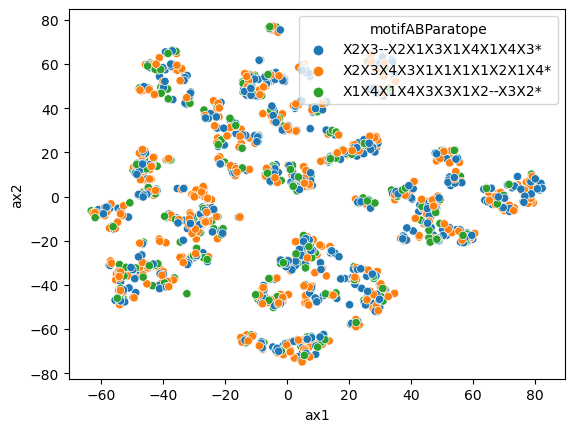

In [228]:
ig_file_type = 'swa_high_low_0.05b_ig'
perf_file_name = 'low95_full_perf.csv'
best_repls = get_best_repl(perf_file_name)
    
for ag in ['1ADQ']:
    best_repl_ag = int(best_repls.loc[ag]['repl'])
    df_ig_ab_info = merge_ig_ag_ab_info(ig_file_type, ag)
    print(f'{ag} {ig_file_type}')
    print('t-SNE')
    ig_clustering('tsne', df_ig_ab_info, best_repl_ag, 'motifABParatope')
    #print('UMAP')
    #ig_clustering('umap', df_ig_ab_info, best_repl_ag, 'motifABParatope')

1ADQ swa_1_vs_all_0.05b_ig
t-SNE
Antigen 1ADQ 
 X2X3--X2X1X3X1X4X1X4X3*    1433
X2X3X4X3X1X1X1X1X2X1X4*    1373
X1X4X1X4X3X3X1X2--X3X2*     684
Name: motifABParatope, dtype: int64


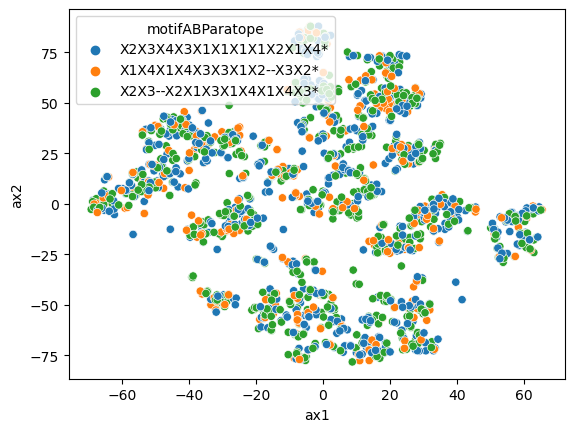

In [229]:
ig_file_type = 'swa_1_vs_all_0.05b_ig'
perf_file_name = 'one_all_full_perf.csv'
best_repls = get_best_repl(perf_file_name)
    
for ag in ['1ADQ']:
    best_repl_ag = int(best_repls.loc[ag]['repl'])
    df_ig_ab_info = merge_ig_ag_ab_info(ig_file_type, ag)
    print(f'{ag} {ig_file_type}')
    print('t-SNE')
    ig_clustering('tsne', df_ig_ab_info, best_repl_ag, 'motifABParatope')
    #print('UMAP')
    #ig_clustering('umap', df_ig_ab_info, best_repl_ag, 'motifABParatope')

In [ ]:
#make dataframe suitable for catplot

columns: interacting True/False, ag, values

In [17]:
def get_cat_degree_df(ig_file_type, perf_file_name, antigens):
    converter = {f"repl_{d}_ig": pd.eval for d in range(1,11)}
    dfs =[]
    for ag in tqdm(antigens, desc = 'Antigens'):
        best_repls = get_best_repl(perf_file_name)
        best_repl_ag = int(best_repls.loc[ag]['repl'])
        df_degree = pd.read_csv(f'./IG/{ag}_{ig_file_type}.txt', sep = '\t', index_col = 0, converters= converter)
        df_degree['degrees'] = df_degree['full_deg_Slide'].apply(lambda x: re.findall('\d',x))
        df_degree['degrees'] = df_degree['degrees'].apply(lambda x: np.array(x).astype(int))
        igs = np.concatenate(df_degree[f'repl_{best_repl_ag}_ig'].values)
        degrees = np.concatenate(df_degree['degrees'].values)
        df_degree_ig = pd.DataFrame({'degree': degrees, 'IG attr': igs})
        df_degree_ig['ag'] = ag
        dfs.append(df_degree_ig)
    df_cat_degree = pd.concat(dfs, axis = 0)
    df_cat_degree['Interacting'] = False
    df_cat_degree.loc[df_cat_degree['degree'] >0, 'Interacting'] = True
    df_cat_degree['IG attr'] = df_cat_degree['IG attr'].astype(float)
    return df_cat_degree
    

In [18]:
antigens = ['3VRL', '1NSN', '3RAJ', '5E94', '1H0D', '1WEJ', '1ADQ', '1FBI','2YPV', '1OB1']  

In [19]:
#ig_file_type = 'swa_high_looser_0.05b_ig'
ig_file_type = 'swa_high_looser_ig'
perf_file_name = 'looser_full_perf.csv'
df_cat_degree_loose = get_cat_degree_df(ig_file_type, perf_file_name, antigens)

Antigens:   0%|          | 0/10 [00:00<?, ?it/s]

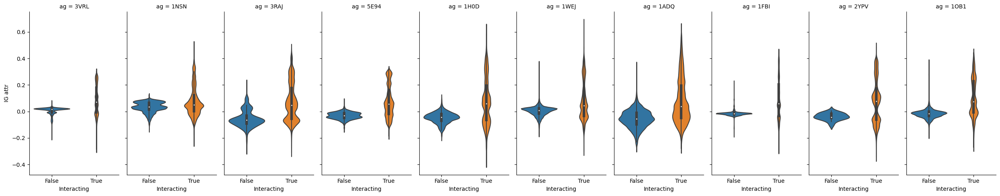

In [170]:
sns.catplot(df_cat_degree_loose, x ='Interacting', y ='IG attr', col='ag', aspect=0.5, kind="violin")

In [20]:
#ig_file_type = 'swa_high_low_0.05b_ig'
ig_file_type = 'swa_high_low_ig'
perf_file_name = 'low95_full_perf.csv'
df_cat_degree_low = get_cat_degree_df(ig_file_type, perf_file_name, antigens)

Antigens:   0%|          | 0/10 [00:00<?, ?it/s]

In [21]:
#ig_file_type = 'swa_1_vs_all_0.05b_ig'
ig_file_type = 'swa_1_vs_all_ig'
perf_file_name = 'one_all_full_perf.csv'
df_cat_degree_one_all = get_cat_degree_df(ig_file_type, perf_file_name, antigens)

Antigens:   0%|          | 0/10 [00:00<?, ?it/s]

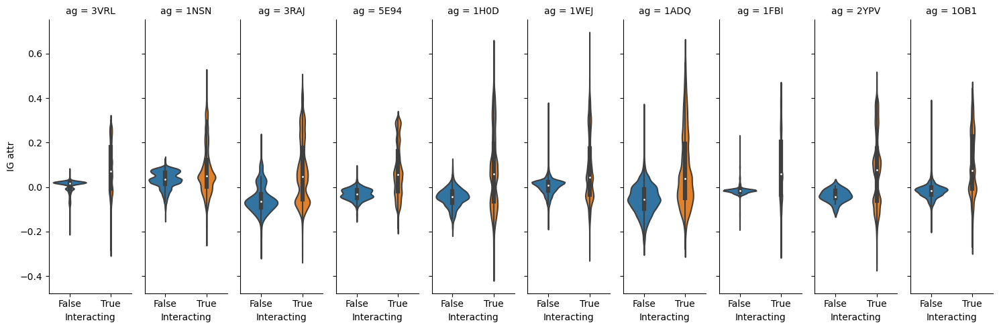

In [208]:
sns.catplot(df_cat_degree_loose, x ='Interacting', y ='IG attr', col='ag', aspect=0.3, kind="violin")

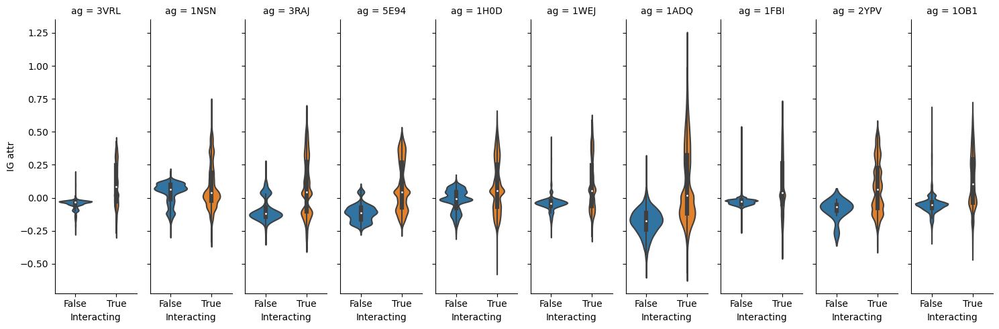

In [209]:
sns.catplot(df_cat_degree_low, x ='Interacting', y ='IG attr', col='ag', aspect=0.3, kind="violin")

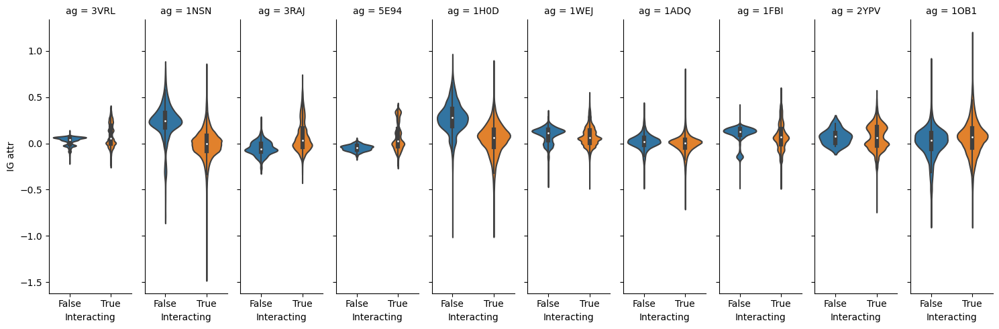

In [210]:
sns.catplot(df_cat_degree_one_all, x ='Interacting', y ='IG attr', col='ag', aspect=0.3, kind="violin")

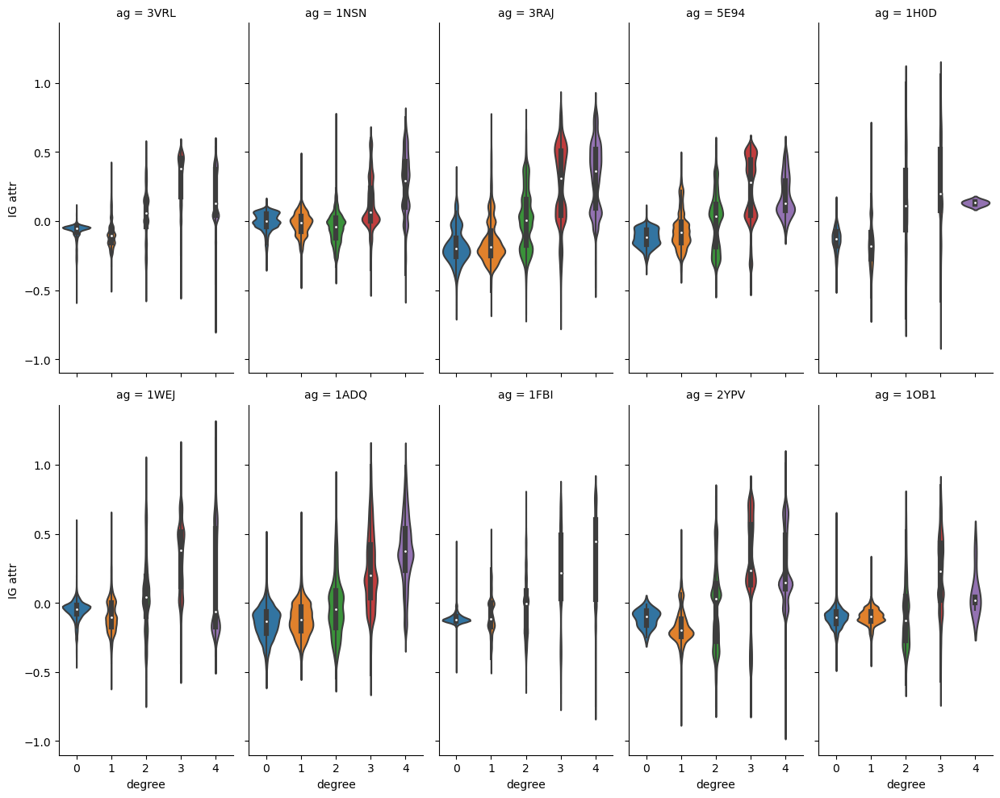

In [22]:
sns.catplot(df_cat_degree_loose, x ='degree', y ='IG attr', col='ag', aspect=0.5, kind="violin", col_wrap=5)

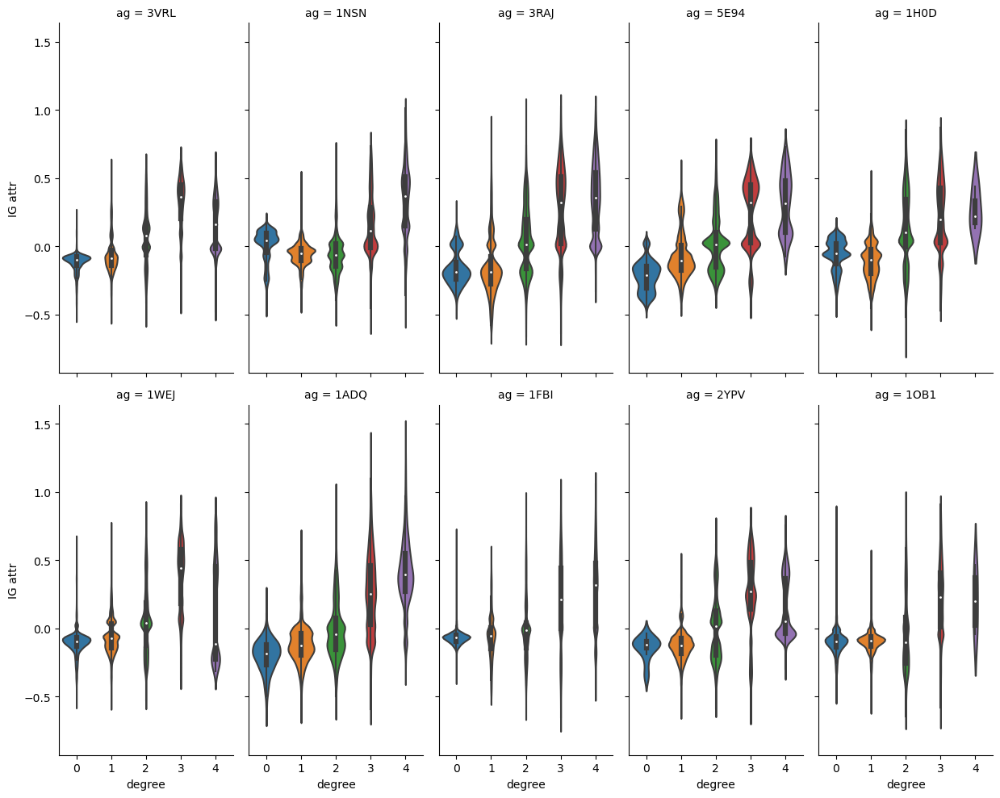

In [23]:
sns.catplot(df_cat_degree_low, x ='degree', y ='IG attr', col='ag', aspect=0.5, kind="violin", col_wrap=5)

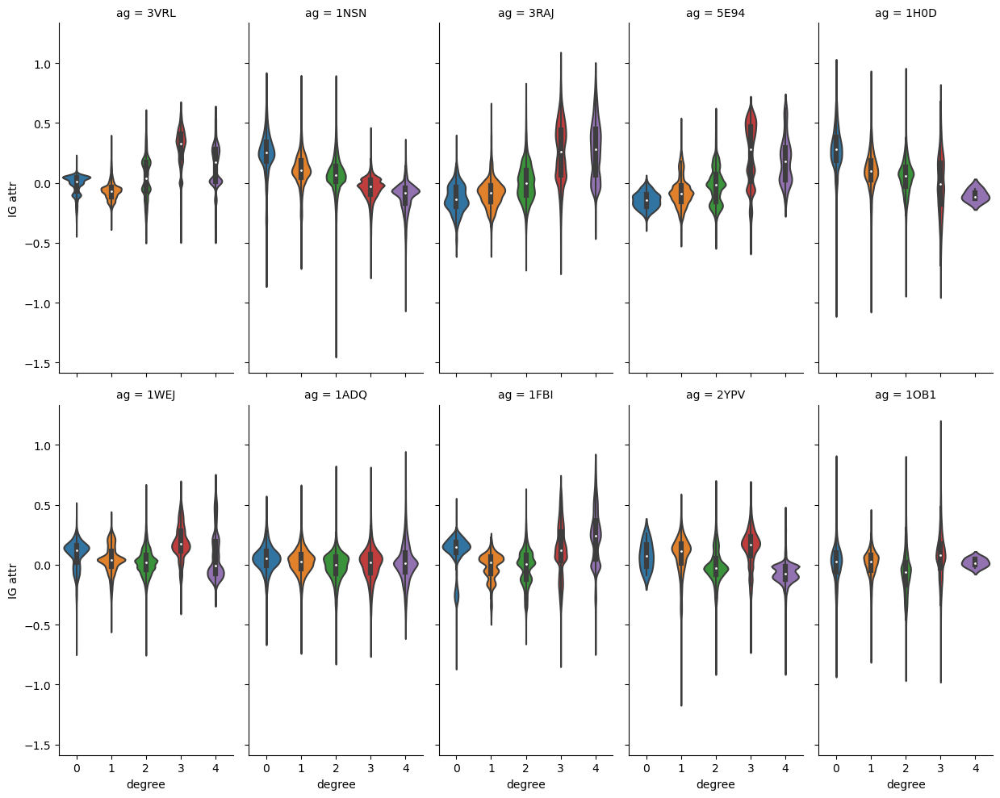

In [24]:
sns.catplot(df_cat_degree_one_all, x ='degree', y ='IG attr', col='ag', aspect=0.5, kind="violin", col_wrap=5)

# For base model

3VRL base_1_vs_all_0b_ig


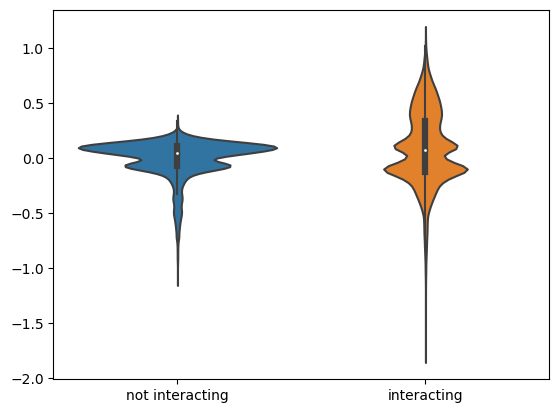

1NSN base_1_vs_all_0b_ig


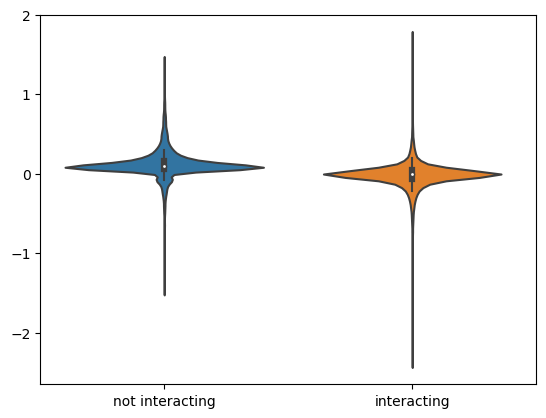

3RAJ base_1_vs_all_0b_ig


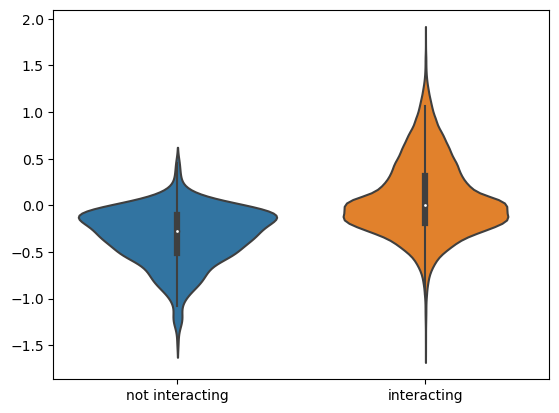

5E94 base_1_vs_all_0b_ig


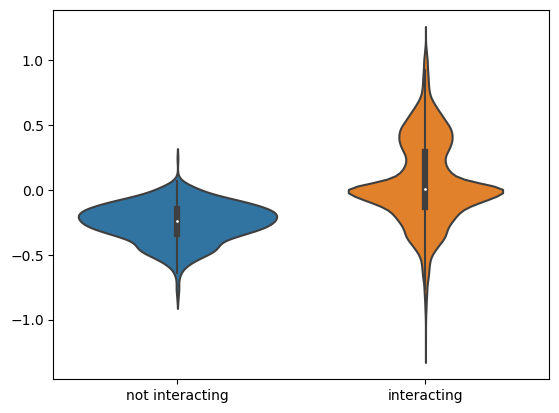

1H0D base_1_vs_all_0b_ig


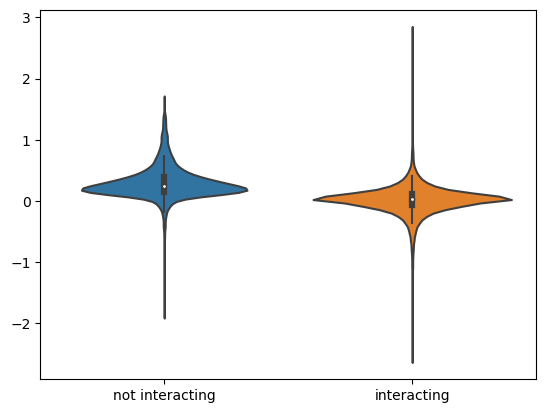

1WEJ base_1_vs_all_0b_ig


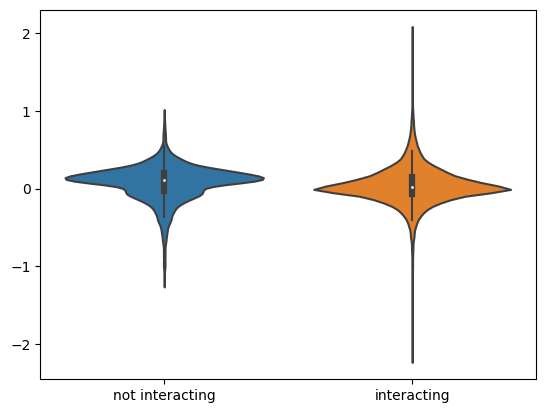

1ADQ base_1_vs_all_0b_ig


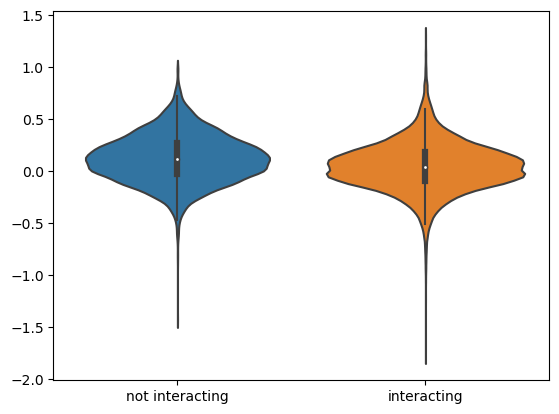

1FBI base_1_vs_all_0b_ig


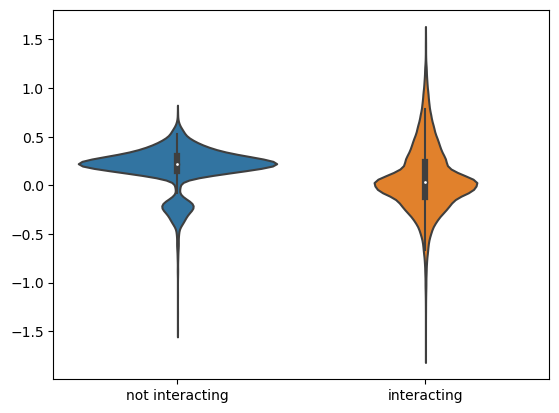

2YPV base_1_vs_all_0b_ig


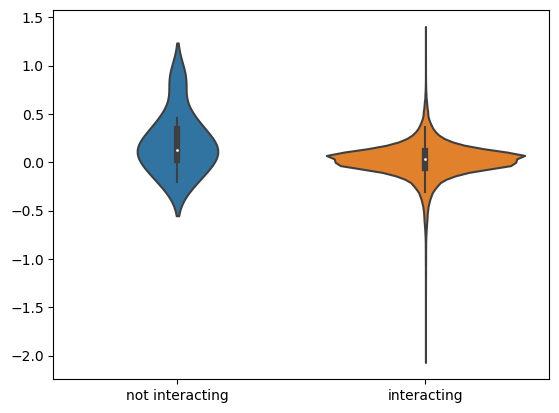

1OB1 base_1_vs_all_0b_ig


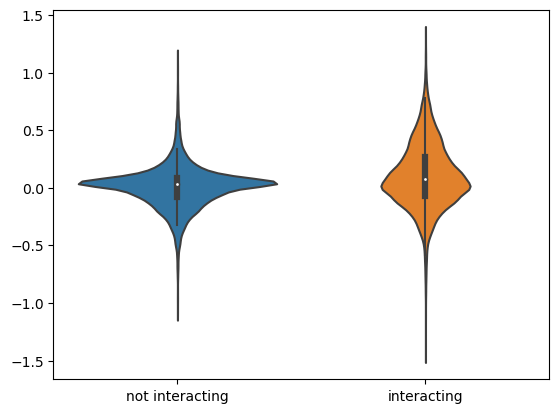

In [50]:
converter = {f"1_vs_all_repl_{d}_ig": pd.eval for d in range(1,11)}
ig_file_type = 'base_1_vs_all_0b_ig'
for ag in antigens:
    df_degree = pd.read_csv(f'./logs/{ag}_base_1_vs_all_ig.txt', sep = '\t', index_col = 0, converters= converter)
    df_degree['degrees'] = df_degree['full_deg_Slide'].apply(lambda x: re.findall('\d',x))
    df_degree['degrees'] = df_degree['degrees'].apply(lambda x: np.array(x).astype(int))
    degree_dict = dict()
    for degree in range(5):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            masks = df_degree['degrees'].apply(lambda x: x == degree)
            df_degree['mask'] = masks
            attr_lists = df_degree.apply(lambda x: np.array(x['1_vs_all_repl_1_ig'])[x['mask']].tolist(), axis=1)
            degree_dict[degree] = sum([*attr_lists], [])
    print(f'{ag} {ig_file_type}')
    binders = np.concatenate([degree_dict[i] for i in range(1,5)])
    non_binders = np.array(degree_dict[0])
    sns.violinplot([non_binders, binders]).set_xticklabels(['not interacting', 'interacting'])
    plt.show()

In [219]:
print(antigens)

['3VRL', '1NSN', '3RAJ', '5E94', '1H0D', '1WEJ', '1ADQ', '1FBI', '2YPV', '1OB1']


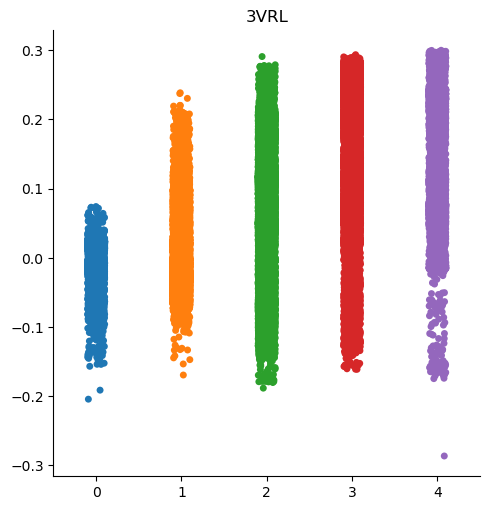

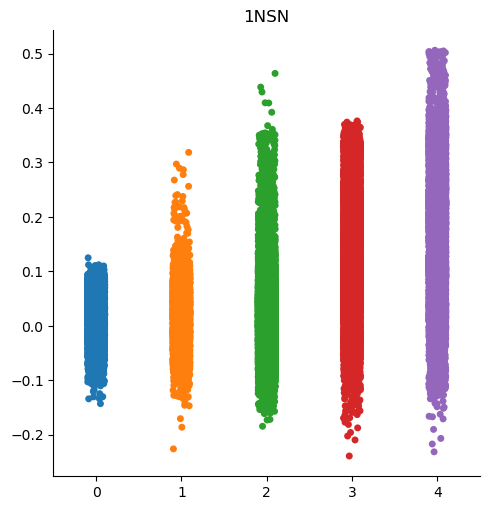

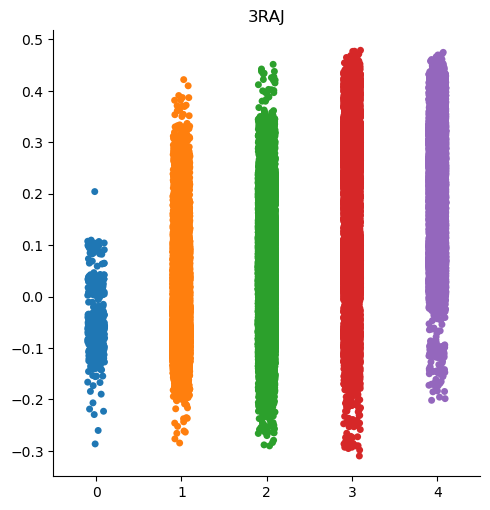

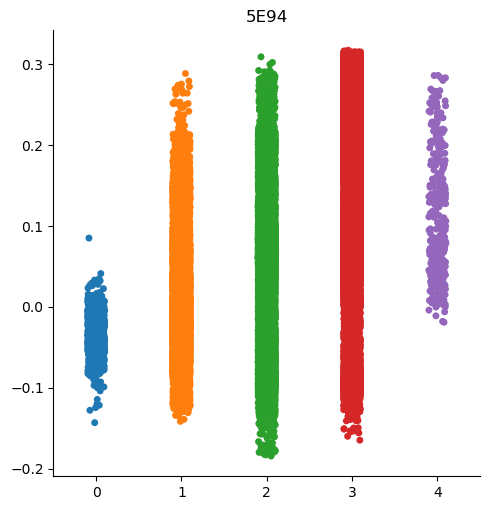

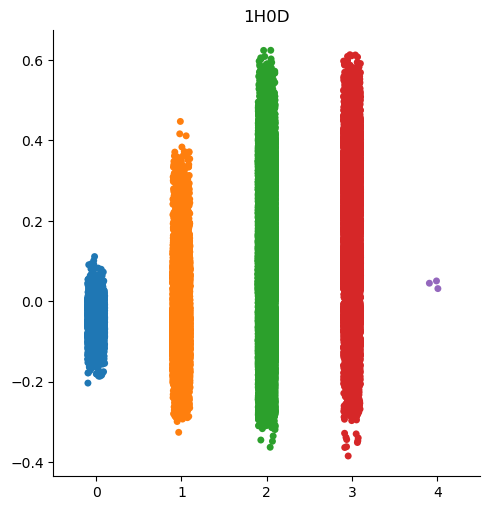

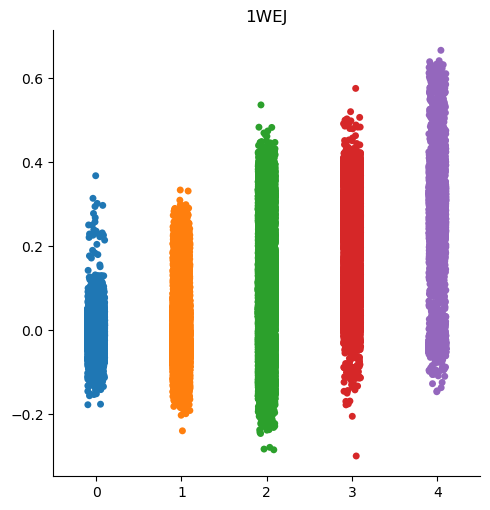

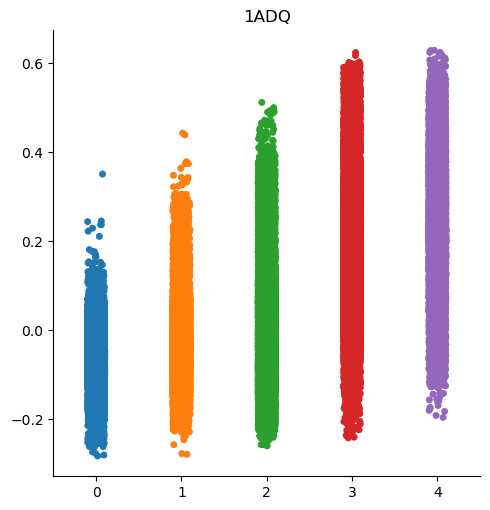

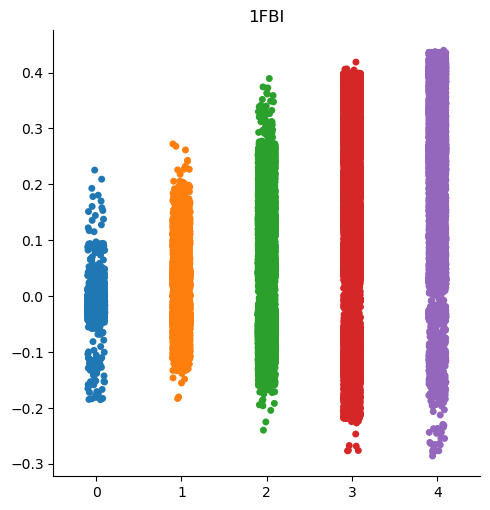

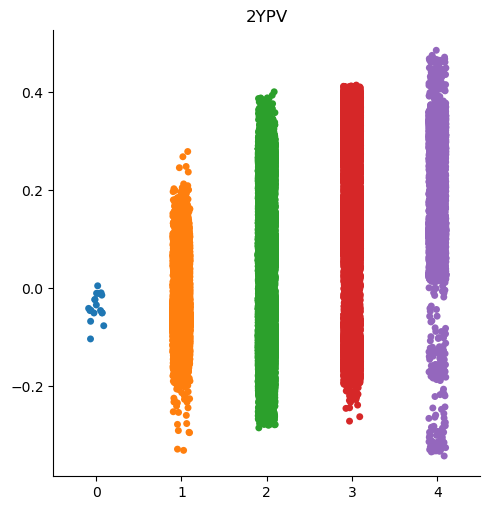

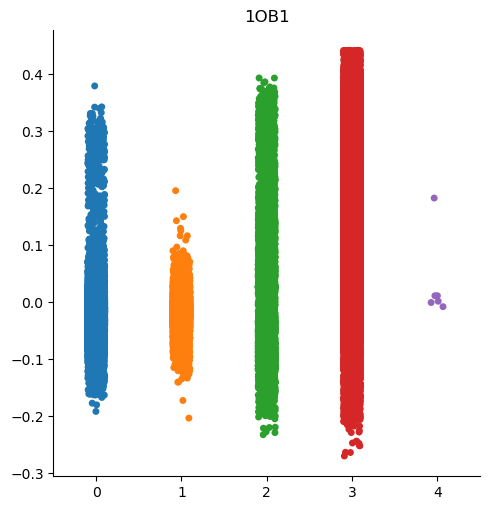

In [14]:
#converter = {f"1_vs_all_repl_{d}_ig": pd.eval for d in range(1,11)}
converter = {f"repl_{d}_ig": pd.eval for d in range(1,11)}
ig_file_type = 'swa_high_looser_0.05b_ig'
perf_file_name = 'looser_full_perf.csv'
for ag in antigens:
    df_perf = pd.read_csv(f'./closed_open_performance/{perf_file_name}', index_col = 0)
    df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
    best_repl = df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
    
    best_repl_ag = int(best_repl.loc[ag]['repl'])
    df_degree = pd.read_csv(f'./IG/{ag}_{ig_file_type}.txt', sep = '\t', index_col = 0, converters= converter)
    df_degree['degrees'] = df_degree['full_deg_Slide'].apply(lambda x: re.findall('\d',x))
    df_degree['degrees'] = df_degree['degrees'].apply(lambda x: np.array(x).astype(int))
    degree_dict = dict()
    for degree in range(5):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            masks = df_degree['degrees'].apply(lambda x: x == degree)
            df_degree['mask'] = masks
            attr_lists = df_degree.apply(lambda x: np.array(x[f'repl_{best_repl_ag}_ig'])[x['mask']].tolist(), axis=1)
            degree_dict[degree] = sum([*attr_lists], [])
    sns.catplot(degree_dict)
    plt.title(ag)
    plt.show()

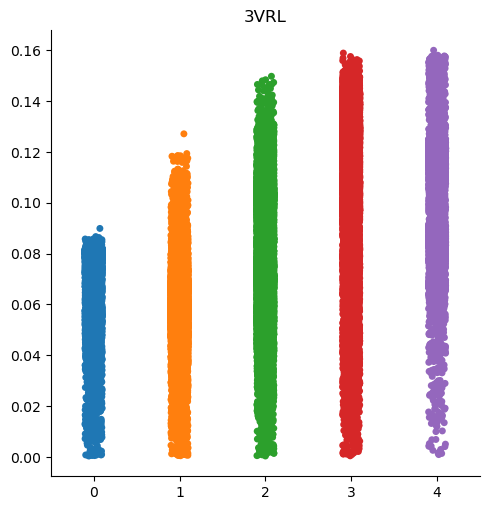

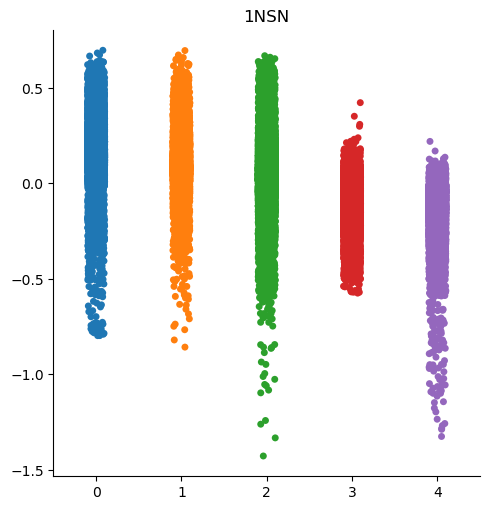

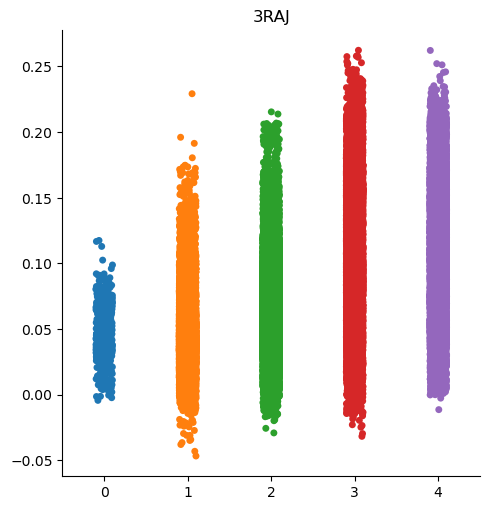

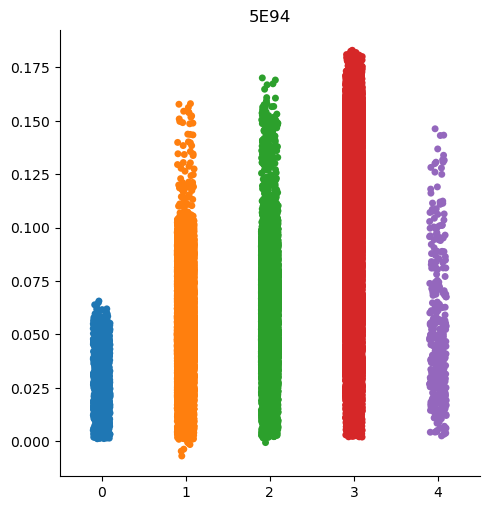

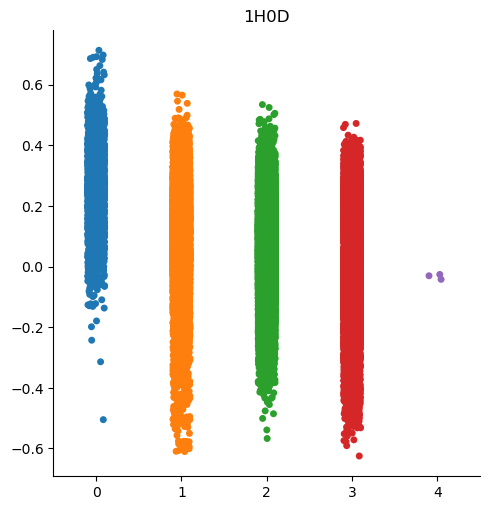

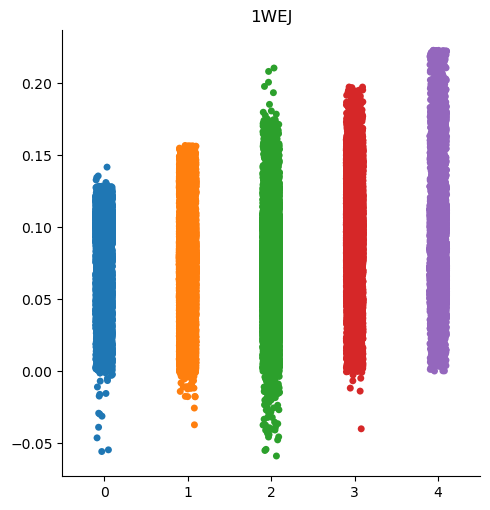

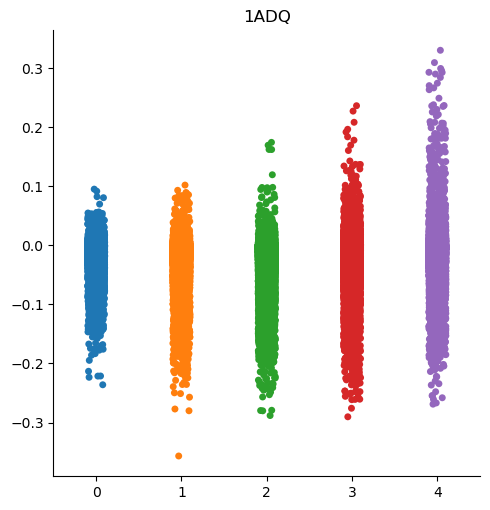

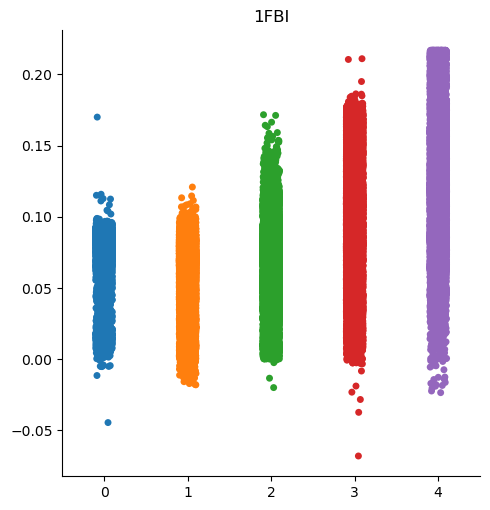

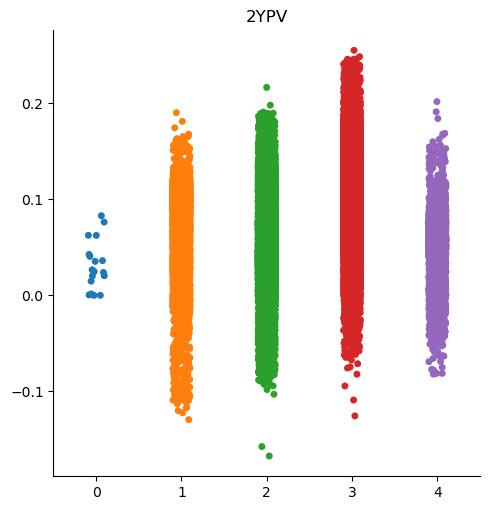

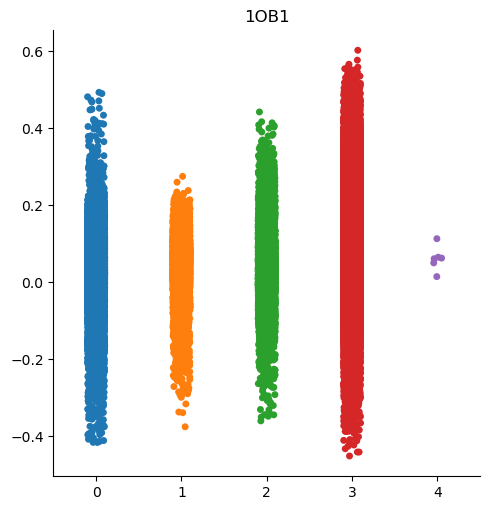

In [15]:
#converter = {f"1_vs_all_repl_{d}_ig": pd.eval for d in range(1,11)}
converter = {f"repl_{d}_ig": pd.eval for d in range(1,11)}
ig_file_type = 'swa_1_vs_all_0.5b_ig'
perf_file_name = 'one_all_full_perf.csv'
for ag in antigens:
    df_perf = pd.read_csv(f'./closed_open_performance/{perf_file_name}', index_col = 0)
    df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
    best_repl = df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
    
    best_repl_ag = int(best_repl.loc[ag]['repl'])
    df_degree = pd.read_csv(f'./IG/{ag}_{ig_file_type}.txt', sep = '\t', index_col = 0, converters= converter)
    df_degree['degrees'] = df_degree['full_deg_Slide'].apply(lambda x: re.findall('\d',x))
    df_degree['degrees'] = df_degree['degrees'].apply(lambda x: np.array(x).astype(int))
    degree_dict = dict()
    for degree in range(5):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            masks = df_degree['degrees'].apply(lambda x: x == degree)
            df_degree['mask'] = masks
            attr_lists = df_degree.apply(lambda x: np.array(x[f'repl_{best_repl_ag}_ig'])[x['mask']].tolist(), axis=1)
            degree_dict[degree] = sum([*attr_lists], [])
    sns.catplot(degree_dict)
    plt.title(ag)
    plt.show()

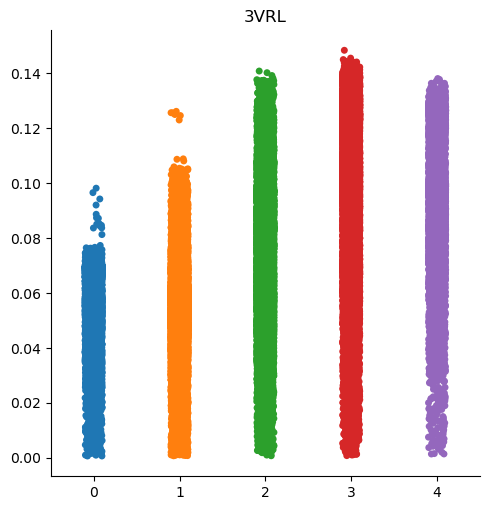

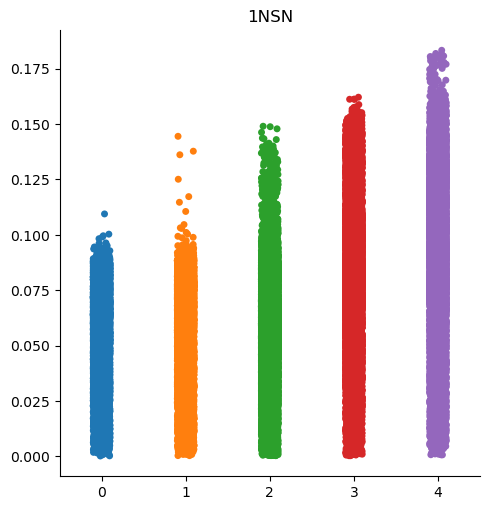

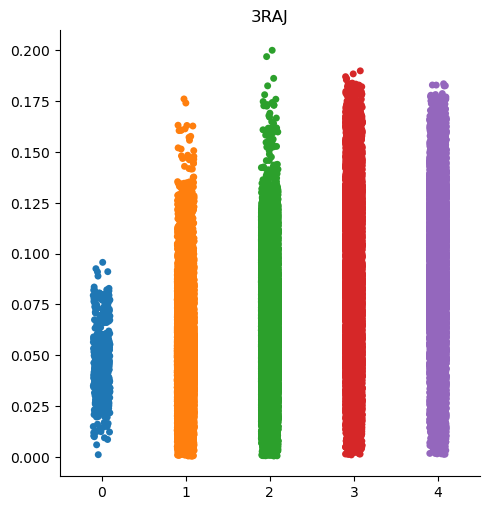

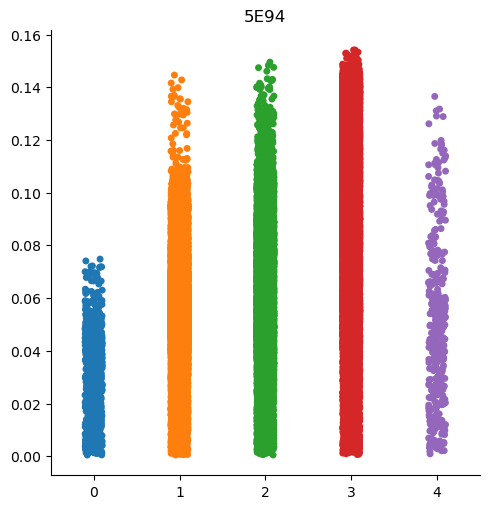

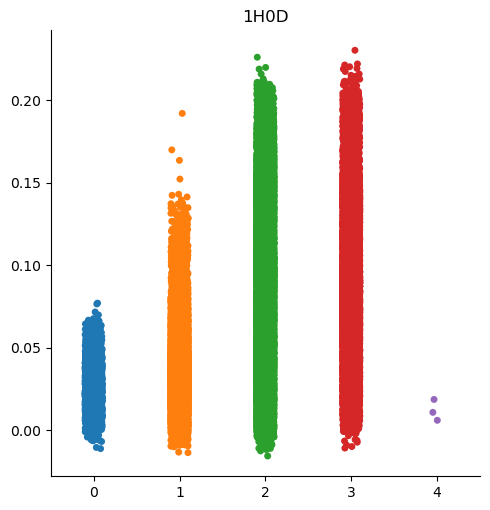

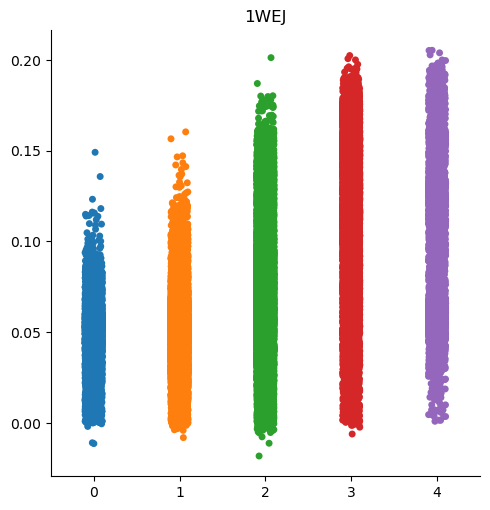

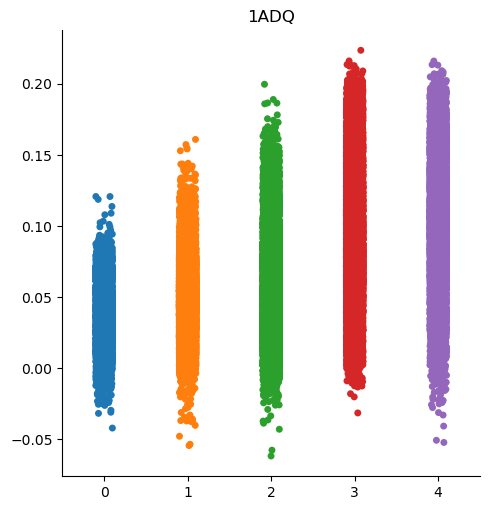

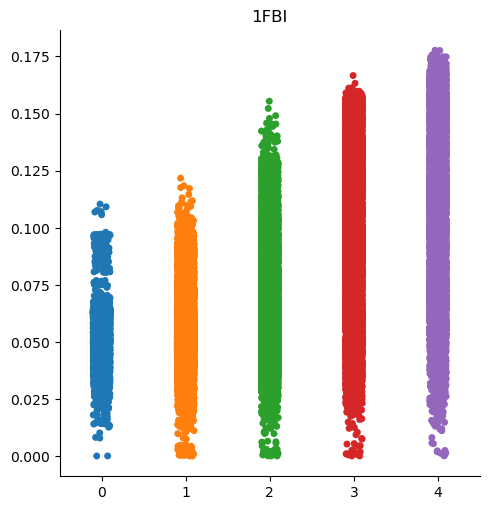

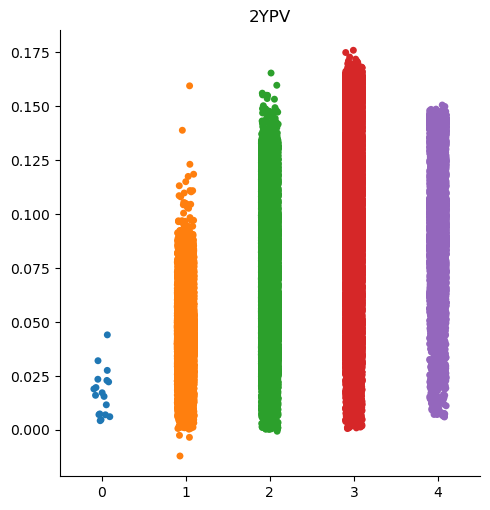

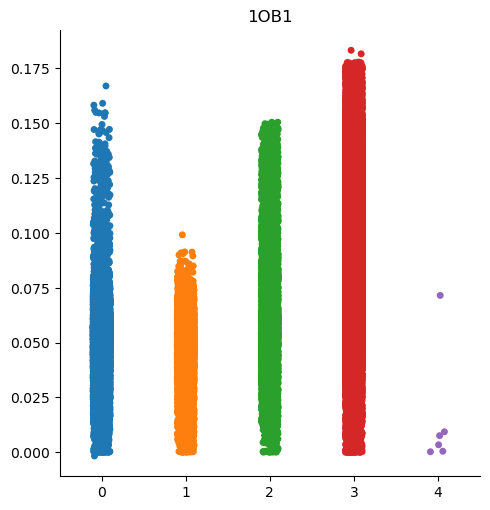

In [16]:
#converter = {f"1_vs_all_repl_{d}_ig": pd.eval for d in range(1,11)}
converter = {f"repl_{d}_ig": pd.eval for d in range(1,11)}
ig_file_type = 'swa_high_looser_0.5b_ig'
perf_file_name = 'looser_full_perf.csv'
for ag in antigens:
    df_perf = pd.read_csv(f'./closed_open_performance/{perf_file_name}', index_col = 0)
    df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
    best_repl = df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
    
    best_repl_ag = int(best_repl.loc[ag]['repl'])
    df_degree = pd.read_csv(f'./IG/{ag}_{ig_file_type}.txt', sep = '\t', index_col = 0, converters= converter)
    df_degree['degrees'] = df_degree['full_deg_Slide'].apply(lambda x: re.findall('\d',x))
    df_degree['degrees'] = df_degree['degrees'].apply(lambda x: np.array(x).astype(int))
    degree_dict = dict()
    for degree in range(5):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            masks = df_degree['degrees'].apply(lambda x: x == degree)
            df_degree['mask'] = masks
            attr_lists = df_degree.apply(lambda x: np.array(x[f'repl_{best_repl_ag}_ig'])[x['mask']].tolist(), axis=1)
            degree_dict[degree] = sum([*attr_lists], [])
    sns.catplot(degree_dict)
    plt.title(ag)
    plt.show()

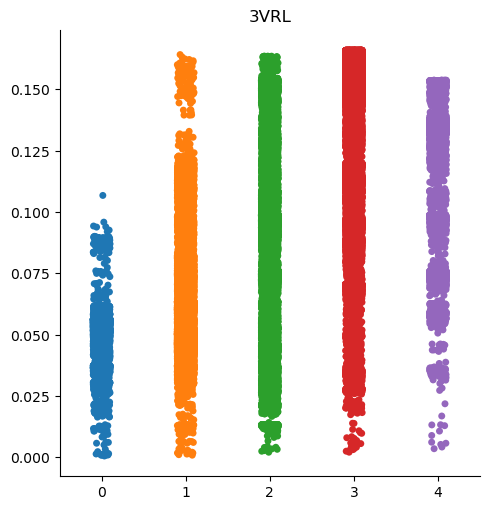

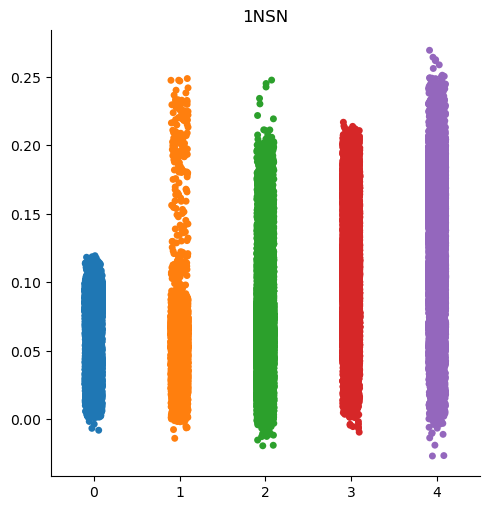

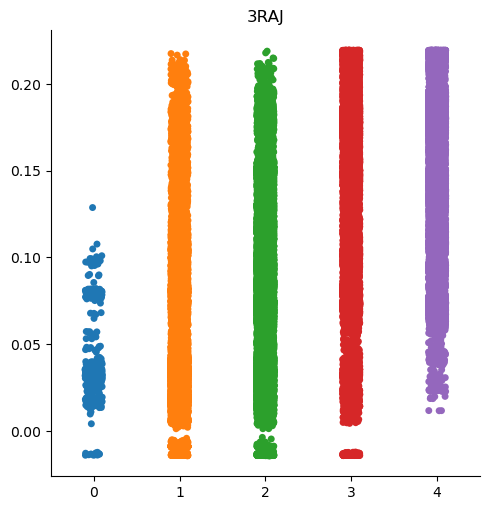

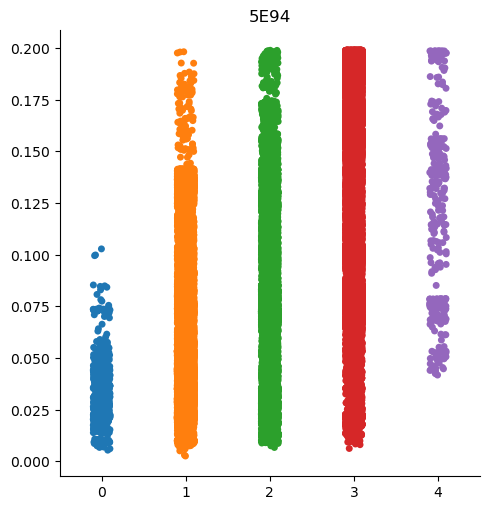

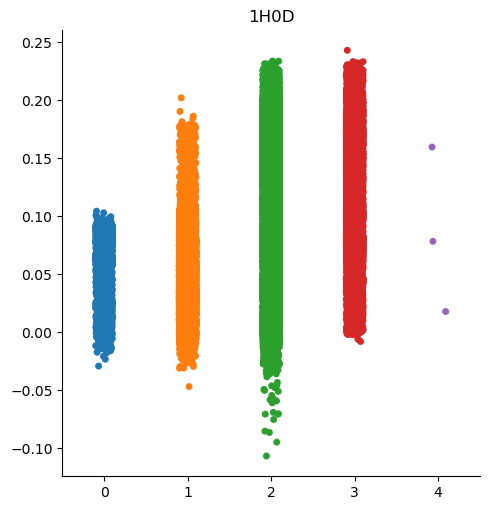

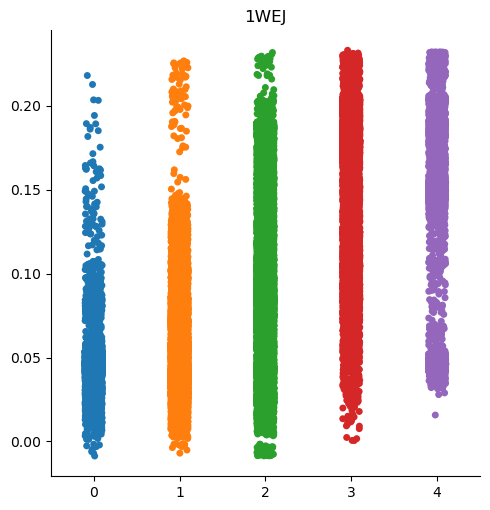

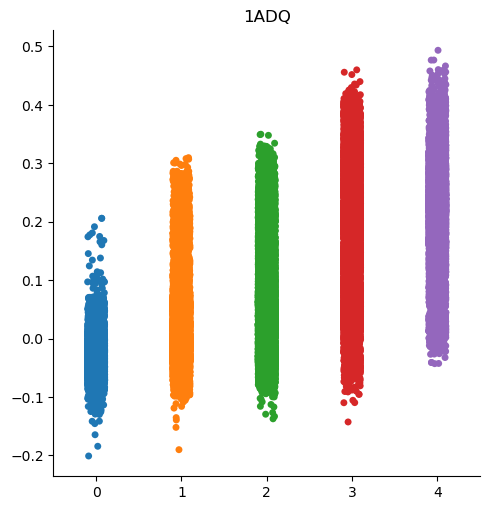

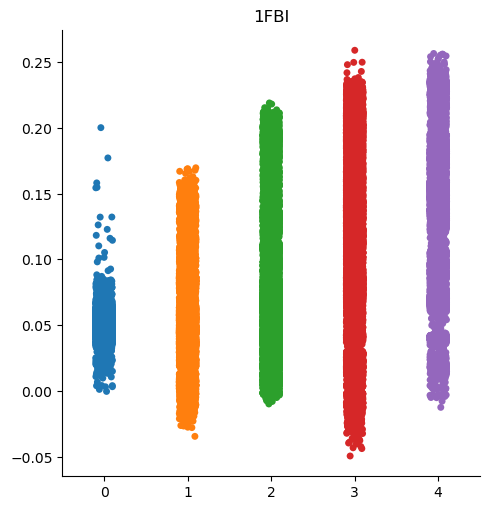

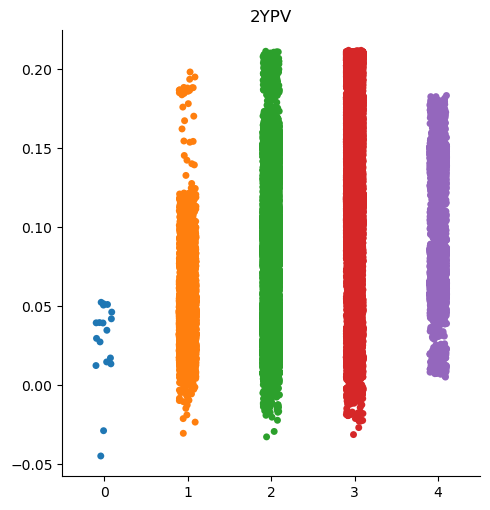

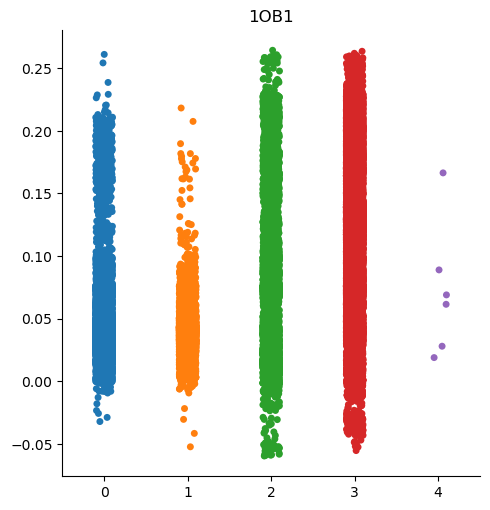

In [17]:
#converter = {f"1_vs_all_repl_{d}_ig": pd.eval for d in range(1,11)}
converter = {f"repl_{d}_ig": pd.eval for d in range(1,11)}
ig_file_type = 'swa_high_low_0.5b_ig'
perf_file_name = 'low95_full_perf.csv'
for ag in antigens:
    df_perf = pd.read_csv(f'./closed_open_performance/{perf_file_name}', index_col = 0)
    df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
    best_repl = df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
    
    best_repl_ag = int(best_repl.loc[ag]['repl'])
    df_degree = pd.read_csv(f'./IG/{ag}_{ig_file_type}.txt', sep = '\t', index_col = 0, converters= converter)
    df_degree['degrees'] = df_degree['full_deg_Slide'].apply(lambda x: re.findall('\d',x))
    df_degree['degrees'] = df_degree['degrees'].apply(lambda x: np.array(x).astype(int))
    degree_dict = dict()
    for degree in range(5):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            masks = df_degree['degrees'].apply(lambda x: x == degree)
            df_degree['mask'] = masks
            attr_lists = df_degree.apply(lambda x: np.array(x[f'repl_{best_repl_ag}_ig'])[x['mask']].tolist(), axis=1)
            degree_dict[degree] = sum([*attr_lists], [])
    sns.catplot(degree_dict)
    plt.title(ag)
    plt.show()

In [ ]:
# Calculate and construct for baseline SN10 model

3VRL swa_high_looser_ig
Antigen 3VRL 
 {'D1T1L2V1Q1A1P1C3K1L1A1L3G1P2A1T1': 6714, 'D1T2L2V1Q1A1P1C3K1L1A1L2G1P1A1T1': 157, 'W1M1D1T2L2V2Q1A1P1C2K1L1L1G1P1A1T1': 66}


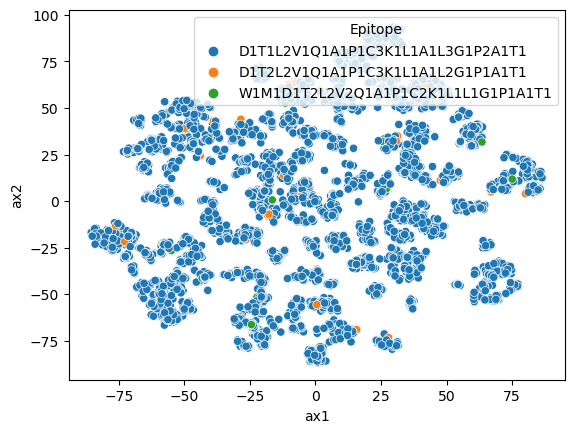

1NSN swa_high_looser_ig
Antigen 1NSN 
 {'I1D1T1V1K1M1T1V1T1Q1D1Y1G1R4G1V2Y1V2N1': 3908, 'I1K1I2D1T1V1K1P1M1T1V1T1Q1D1K1Y1G1R3G1V1V1N1': 1828, 'I1K1I2D2D1T1V1K1P1M1T1V1T2E1H1Y1G1R1V1': 487}


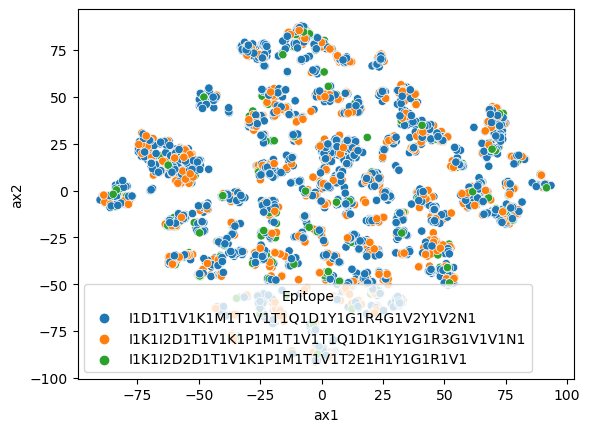

3RAJ swa_high_looser_ig
Antigen 3RAJ 
 {'T1F1P1A1K2I1D1L2F1L1Y1L1A2D1P1D1P1V1D1R1G1G1': 2930, 'T1F1P1A1K2T1H1E1P1C1F2L2D1Y1L1A2D1P1D1P1V1': 1471, 'T1F1P1A1K2T1H1R1D1F2T1L2D1Y1L1A2D1P1D1P1V1': 593}


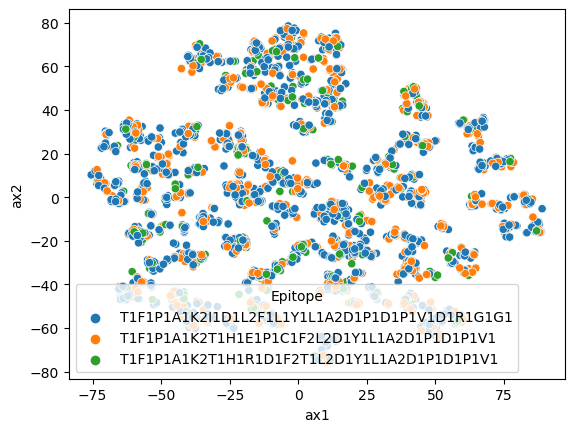

5E94 swa_high_looser_ig
Antigen 5E94 
 {'T1D1E1H1V1Y1F2L1Q1S2S2L1P1W1R2D1L2L1': 5947, 'E1H1V1Y1F2L1Q1S2S1W1D1L2L1L2L1Y1': 304, 'D1E1Y1F1L1Q1S2S2W1R1D1L2S1L3L1Y1': 190}


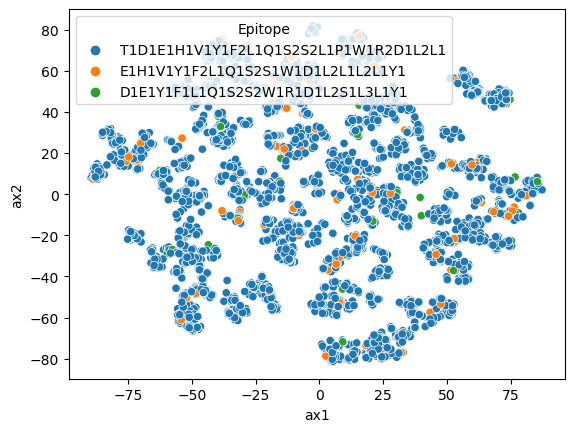

1H0D swa_high_looser_ig
Antigen 1H0D 
 {'P1Q1G1R1I2S1S2S1F1Q2V1G1F1V1H1L1F1': 3946, 'D1S1T1Q1T1N1R1I2S1S1F1V1L1V2H2L1D1F1': 2031, 'A1I1C1N2N1R3I2S2K1S1F1Q1V1H1L1F1': 578}


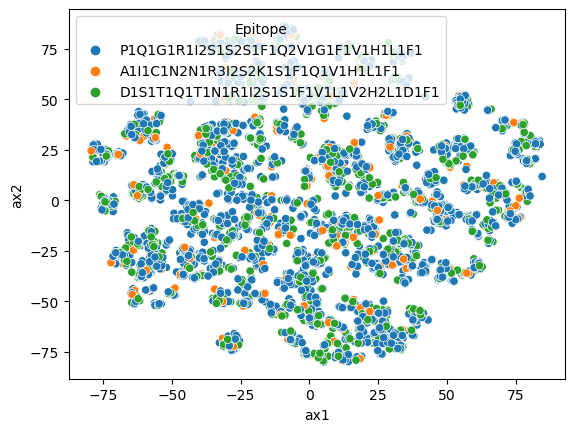

1WEJ swa_high_looser_ig
Antigen 1WEJ 
 {'F1G2K2K1N1G3I1T2W1K2T1Y1A1T1N1': 5786, 'G1F1G2K2K1N1G1I1T1W1K2A2Y1T2N1': 456, 'V1Q1C2A2Q1T2K1K2T1P1G1T2F1A1': 355}


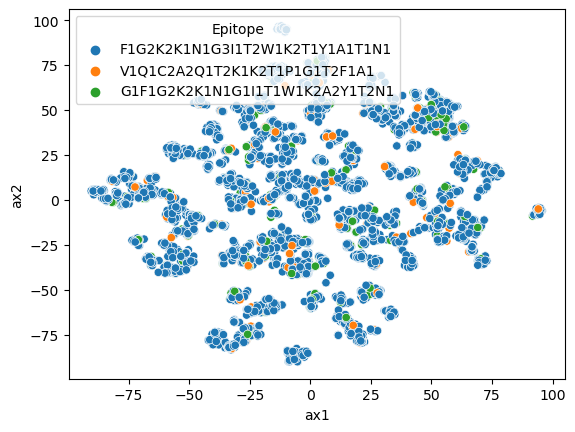

1ADQ swa_high_looser_ig
Antigen 1ADQ 
 {'P1V1F1V3D3V1S1Q2Q1V1T1K1P1E1Y1R2V1V1': 2363, 'L1R1P1W1V1D2V1Q1V1A1K1T1V1L1H1Q3N1W1L1Y1': 1523, 'S1W1V1D1V2Q1V3N1A1K1T2V1L2H1N1Y1': 740}


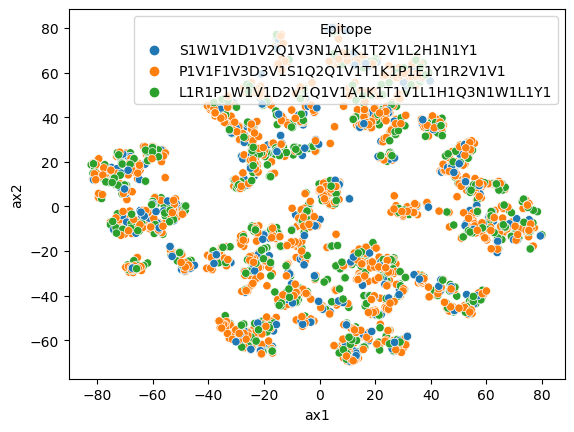

1FBI swa_high_looser_ig
Antigen 1FBI 
 {'S1N1N1T1N2N1G1N1S2W1S1R1L1K2N1A2W1V3W1': 7223}


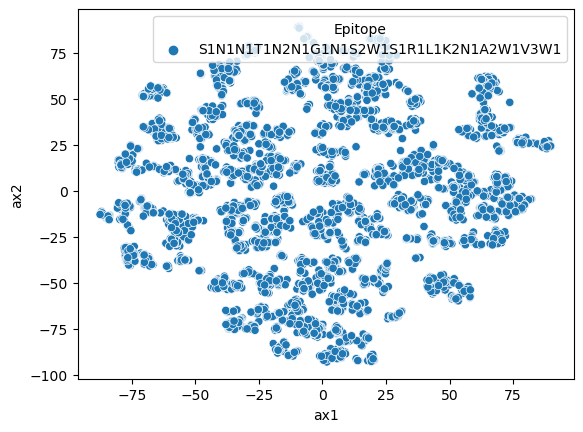

2YPV swa_high_looser_ig
Antigen 2YPV 
 {'Q1S1R2N1K2L1E1I1R2Q1I2L2I1T1Q1E2Q1H1G1L1': 6345, 'D1Q1S1R3N1K2L1E1R1Q1I2L2E1Q1D1I1G1L2A1': 284, 'T1D2Q1S1R3K1N1K1N1G1I1E1Q1D1I3G1L2A1L1': 133}


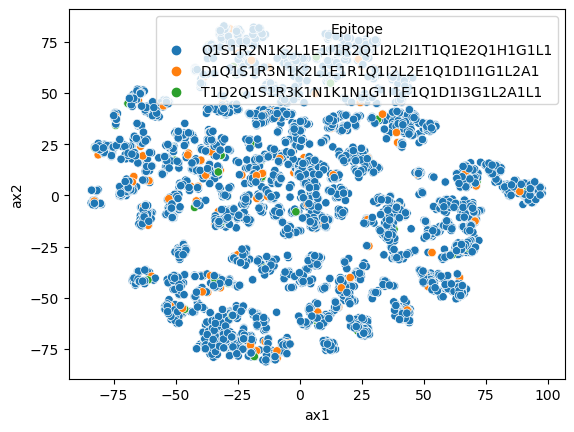

1OB1 swa_high_looser_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 4927, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1742, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 89}


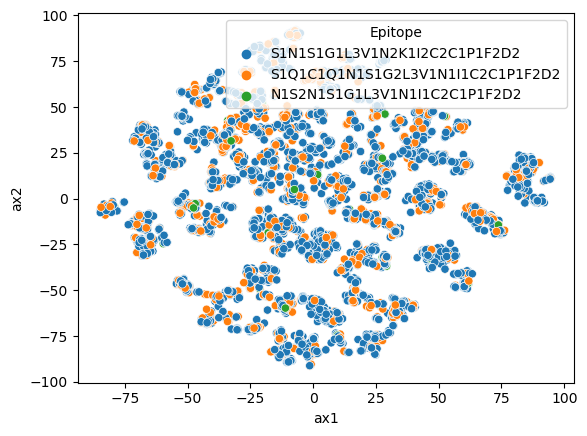

In [45]:
train_type = 'swa_high_looser_ig'

#find best replicate
df_perf = pd.read_csv(f'./closed_open_performance/{perf_file_name[train_type]}_full_perf.csv', index_col = 0)
df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
best_repl = df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
    
for ag in antigens:
    best_repl_ag = int(best_repl.loc[ag]['repl'])
    #open IG predictions
    df_imp_pred = pd.read_csv(f'./IG/{ag}_{train_type}.txt', sep='\t', index_col = 0)
    #df_imp_pred = pd.read_csv(f'./logs/{ag}_swa_1_vs_all_ig.txt', sep='\t', converters = converter, index_col = 0)
    #df_imp_pred['full_deg_Slide'] = df_imp_pred['full_deg_Slide'].apply(eval)
    path_epi = glob.glob(f'../data/Slide_importance/{ag}_[A-Z]_Task4_Slice_ParaEpi.txt')[0]
    para_epi = pd.read_csv(path_epi, sep='\t')
    df_imp_pred = df_imp_pred.merge(para_epi, on=['Slide', 'Label', 'seqABParatope', 'AAcompoFullSlice'])
    print(f'{ag} {train_type}')
    tsne_clustering(df_imp_pred, best_repl_ag)

3VRL swa_high_low_ig
Antigen 3VRL 
 {'D1T1L2V1Q1A1P1C3K1L1A1L3G1P2A1T1': 6969, 'D1T2L2V1Q1A1P1C3K1L1A1L2G1P1A1T1': 197, 'W1M1D1T2L2V2Q1A1P1C2K1L1L1G1P1A1T1': 124}


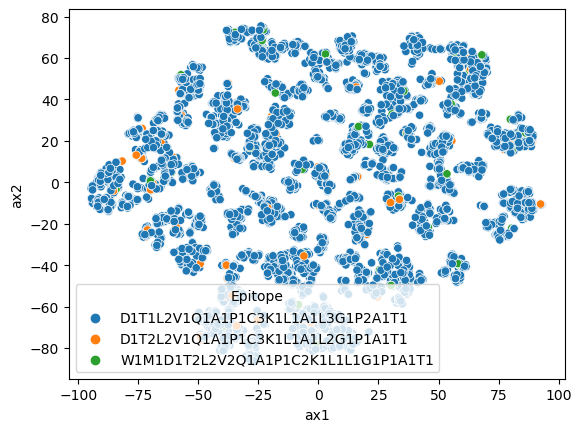

1NSN swa_high_low_ig
Antigen 1NSN 
 {'I1D1T1V1K1M1T1V1T1Q1D1Y1G1R4G1V2Y1V2N1': 4041, 'I1K1I2D1T1V1K1P1M1T1V1T1Q1D1K1Y1G1R3G1V1V1N1': 1934, 'I1K1I2D2D1T1V1K1P1M1T1V1T2E1H1Y1G1R1V1': 807}


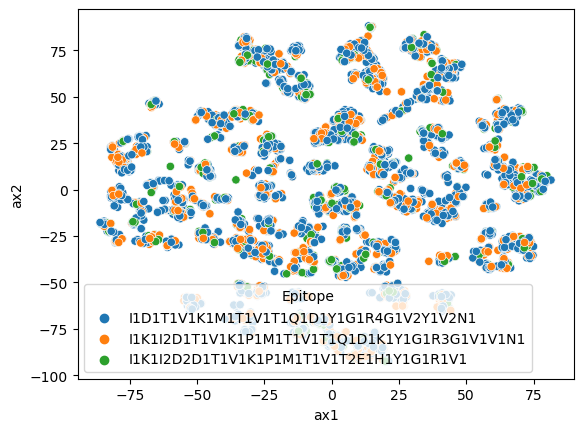

3RAJ swa_high_low_ig
Antigen 3RAJ 
 {'T1F1P1A1K2I1D1L2F1L1Y1L1A2D1P1D1P1V1D1R1G1G1': 3095, 'T1F1P1A1K2T1H1E1P1C1F2L2D1Y1L1A2D1P1D1P1V1': 1673, 'T1F1P1A1K2T1H1R1D1F2T1L2D1Y1L1A2D1P1D1P1V1': 809}


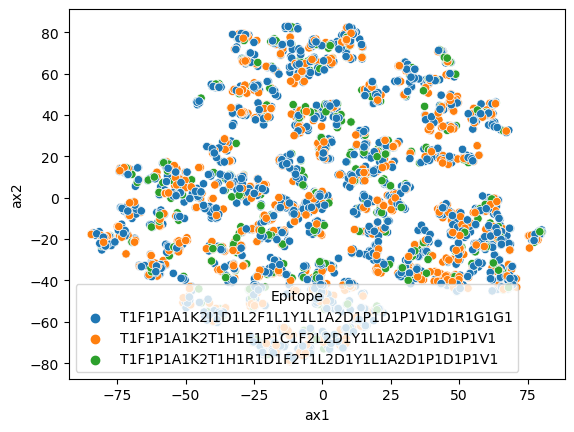

5E94 swa_high_low_ig
Antigen 5E94 
 {'T1D1E1H1V1Y1F2L1Q1S2S2L1P1W1R2D1L2L1': 6134, 'E1H1V1Y1F2L1Q1S2S1W1D1L2L1L2L1Y1': 411, 'D1E1Y1F1L1Q1S2S2W1R1D1L2S1L3L1Y1': 229}


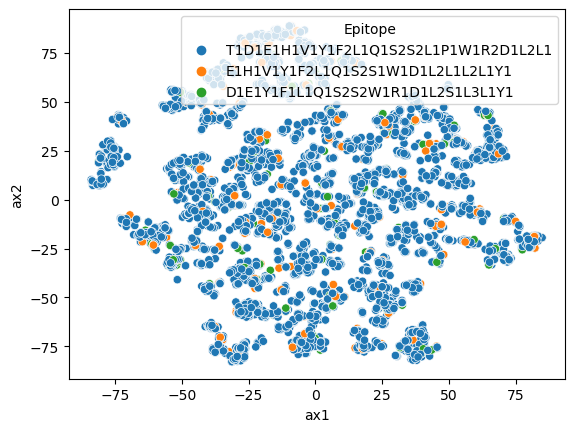

1H0D swa_high_low_ig
Antigen 1H0D 
 {'P1Q1G1R1I2S1S2S1F1Q2V1G1F1V1H1L1F1': 4124, 'D1S1T1Q1T1N1R1I2S1S1F1V1L1V2H2L1D1F1': 2384, 'A1I1C1N2N1R3I2S2K1S1F1Q1V1H1L1F1': 672}


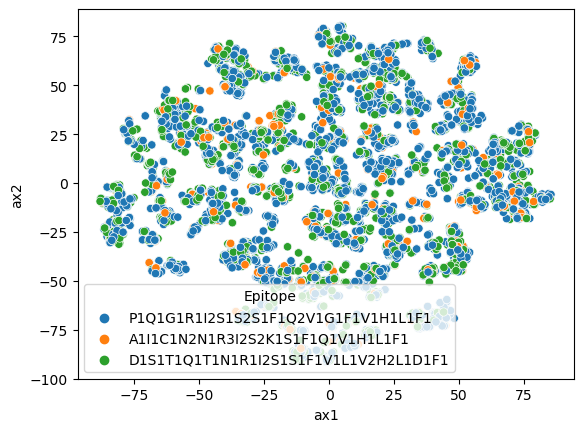

1WEJ swa_high_low_ig
Antigen 1WEJ 
 {'F1G2K2K1N1G3I1T2W1K2T1Y1A1T1N1': 5946, 'V1Q1C2A2Q1T2K1K2T1P1G1T2F1A1': 541, 'G1F1G2K2K1N1G1I1T1W1K2A2Y1T2N1': 500}


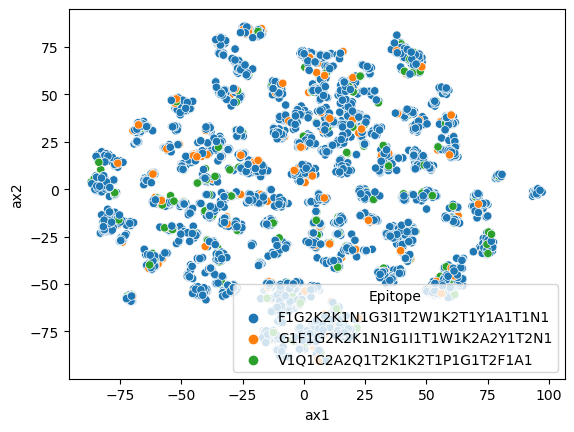

1ADQ swa_high_low_ig
Antigen 1ADQ 
 {'P1V1F1V3D3V1S1Q2Q1V1T1K1P1E1Y1R2V1V1': 2496, 'L1R1P1W1V1D2V1Q1V1A1K1T1V1L1H1Q3N1W1L1Y1': 1600, 'S1W1V1D1V2Q1V3N1A1K1T2V1L2H1N1Y1': 1142}


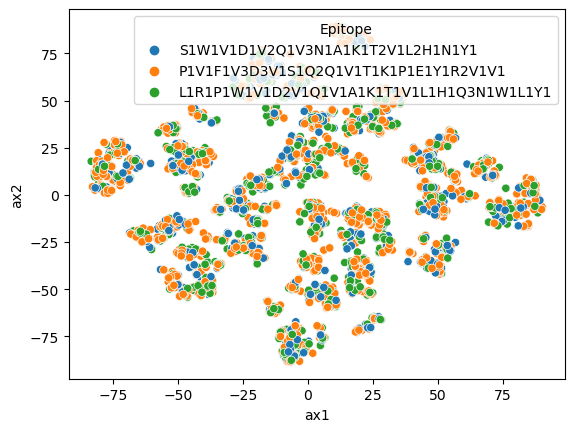

1FBI swa_high_low_ig
Antigen 1FBI 
 {'S1N1N1T1N2N1G1N1S2W1S1R1L1K2N1A2W1V3W1': 7327}


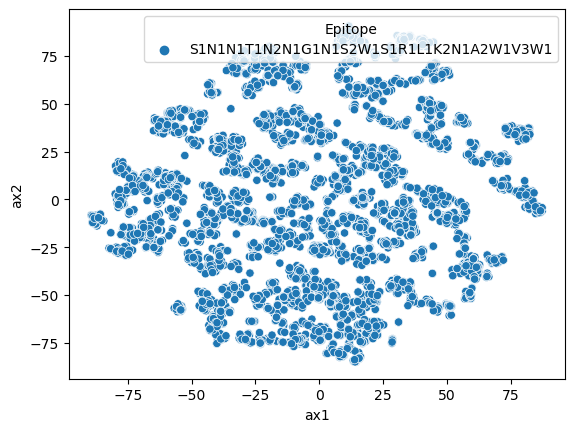

2YPV swa_high_low_ig
Antigen 2YPV 
 {'Q1S1R2N1K2L1E1I1R2Q1I2L2I1T1Q1E2Q1H1G1L1': 6443, 'D1Q1S1R3N1K2L1E1R1Q1I2L2E1Q1D1I1G1L2A1': 323, 'T1D2Q1S1R3K1N1K1N1G1I1E1Q1D1I3G1L2A1L1': 183}


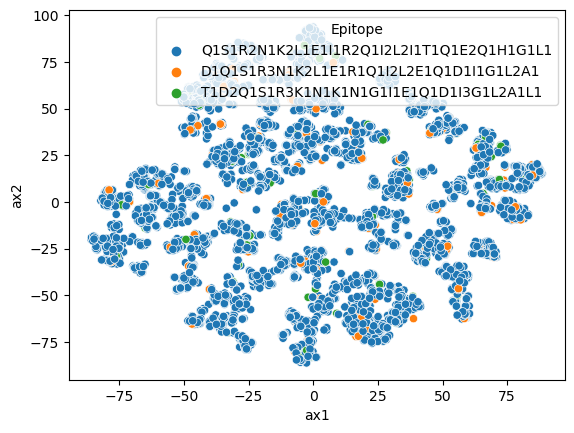

1OB1 swa_high_low_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5232, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1858, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 113}


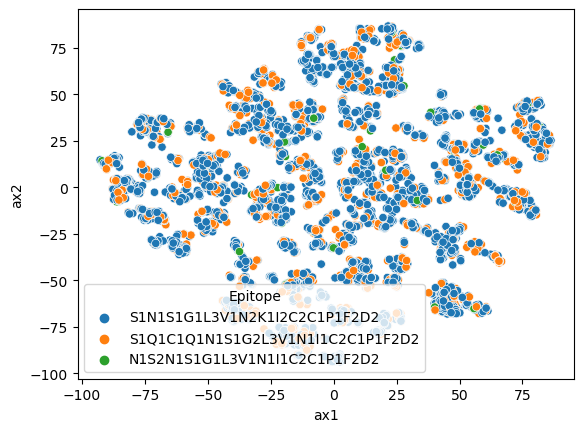

In [46]:
train_type = 'swa_high_low_ig'

#find best replicate
df_perf = pd.read_csv(f'./closed_open_performance/{perf_file_name[train_type]}_full_perf.csv', index_col = 0)
df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
best_repl = df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
    
for ag in antigens:
    best_repl_ag = int(best_repl.loc[ag]['repl'])
    #open IG predictions
    df_imp_pred = pd.read_csv(f'./IG/{ag}_{train_type}.txt', sep='\t', index_col = 0)
    #df_imp_pred = pd.read_csv(f'./logs/{ag}_swa_1_vs_all_ig.txt', sep='\t', converters = converter, index_col = 0)
    #df_imp_pred['full_deg_Slide'] = df_imp_pred['full_deg_Slide'].apply(eval)
    path_epi = glob.glob(f'../data/Slide_importance/{ag}_[A-Z]_Task4_Slice_ParaEpi.txt')[0]
    para_epi = pd.read_csv(path_epi, sep='\t')
    df_imp_pred = df_imp_pred.merge(para_epi, on=['Slide', 'Label', 'seqABParatope', 'AAcompoFullSlice'])
    print(f'{ag} {train_type}')
    tsne_clustering(df_imp_pred, best_repl_ag)

3VRL swa_1_vs_all_ig
Antigen 3VRL 
 {'D1T1L2V1Q1A1P1C3K1L1A1L3G1P2A1T1': 6884, 'D1T2L2V1Q1A1P1C3K1L1A1L2G1P1A1T1': 178, 'W1M1D1T2L2V2Q1A1P1C2K1L1L1G1P1A1T1': 99}


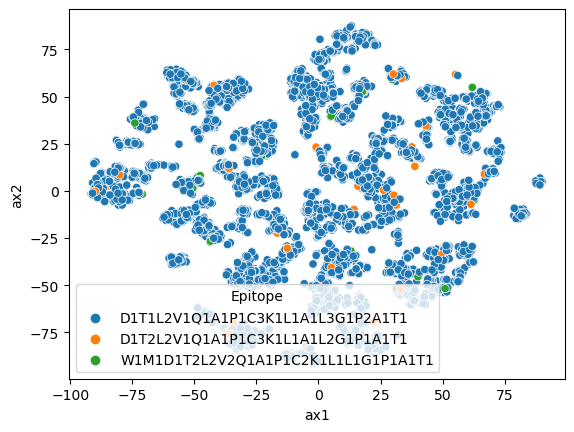

1NSN swa_1_vs_all_ig
Antigen 1NSN 
 {'I1D1T1V1K1M1T1V1T1Q1D1Y1G1R4G1V2Y1V2N1': 4011, 'I1K1I2D1T1V1K1P1M1T1V1T1Q1D1K1Y1G1R3G1V1V1N1': 1943, 'I1K1I2D2D1T1V1K1P1M1T1V1T2E1H1Y1G1R1V1': 663}


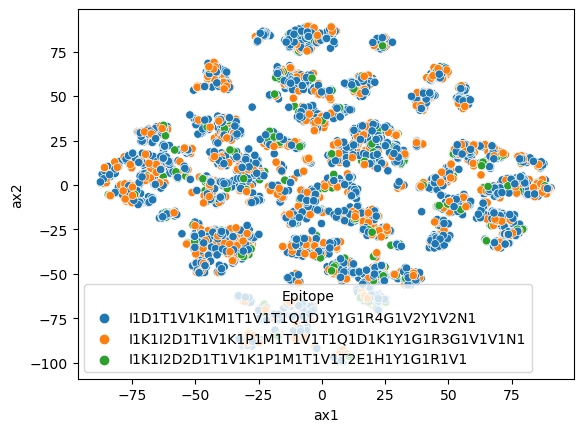

3RAJ swa_1_vs_all_ig
Antigen 3RAJ 
 {'T1F1P1A1K2I1D1L2F1L1Y1L1A2D1P1D1P1V1D1R1G1G1': 3024, 'T1F1P1A1K2T1H1E1P1C1F2L2D1Y1L1A2D1P1D1P1V1': 1597, 'T1F1P1A1K2T1H1R1D1F2T1L2D1Y1L1A2D1P1D1P1V1': 547}


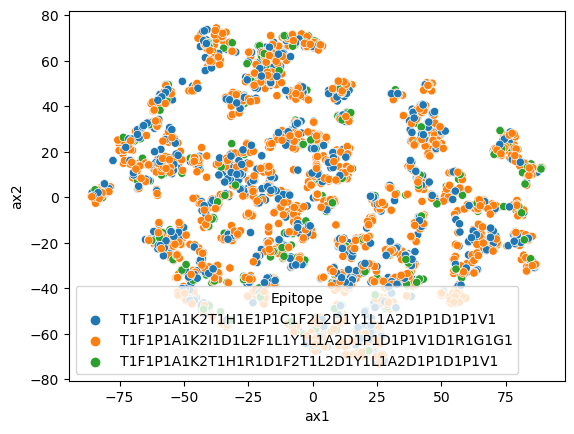

5E94 swa_1_vs_all_ig
Antigen 5E94 
 {'T1D1E1H1V1Y1F2L1Q1S2S2L1P1W1R2D1L2L1': 6038, 'E1H1V1Y1F2L1Q1S2S1W1D1L2L1L2L1Y1': 357, 'D1E1Y1F1L1Q1S2S2W1R1D1L2S1L3L1Y1': 181}


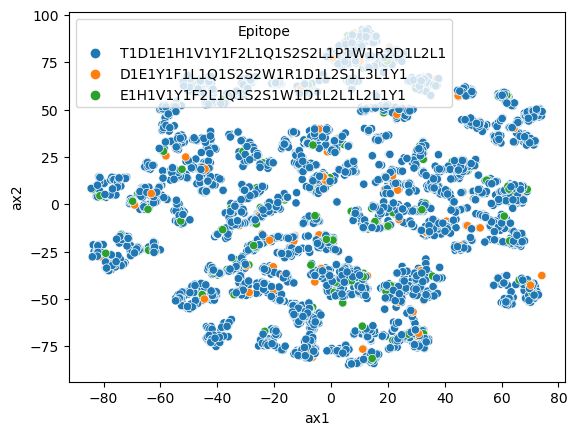

1H0D swa_1_vs_all_ig
Antigen 1H0D 
 {'P1Q1G1R1I2S1S2S1F1Q2V1G1F1V1H1L1F1': 3901, 'D1S1T1Q1T1N1R1I2S1S1F1V1L1V2H2L1D1F1': 2344, 'A1I1C1N2N1R3I2S2K1S1F1Q1V1H1L1F1': 654}


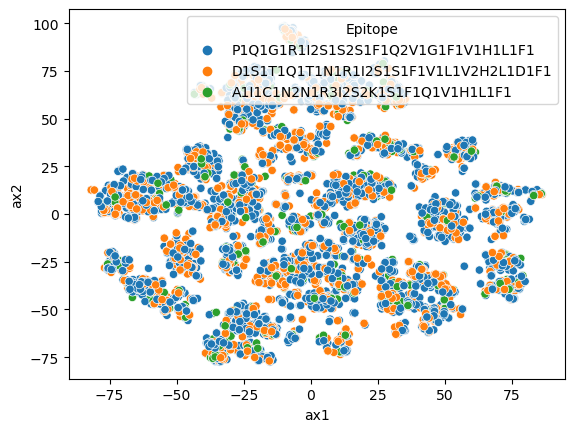

1WEJ swa_1_vs_all_ig
Antigen 1WEJ 
 {'F1G2K2K1N1G3I1T2W1K2T1Y1A1T1N1': 5793, 'G1F1G2K2K1N1G1I1T1W1K2A2Y1T2N1': 453, 'V1Q1C2A2Q1T2K1K2T1P1G1T2F1A1': 401}


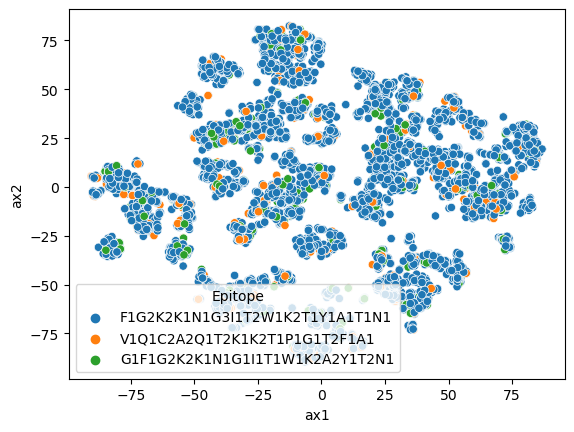

1ADQ swa_1_vs_all_ig
Antigen 1ADQ 
 {'P1V1F1V3D3V1S1Q2Q1V1T1K1P1E1Y1R2V1V1': 2449, 'L1R1P1W1V1D2V1Q1V1A1K1T1V1L1H1Q3N1W1L1Y1': 1569, 'S1W1V1D1V2Q1V3N1A1K1T2V1L2H1N1Y1': 869}


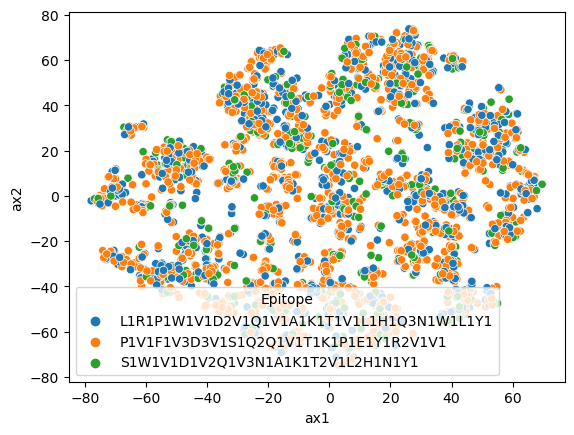

1FBI swa_1_vs_all_ig
Antigen 1FBI 
 {'S1N1N1T1N2N1G1N1S2W1S1R1L1K2N1A2W1V3W1': 7169}


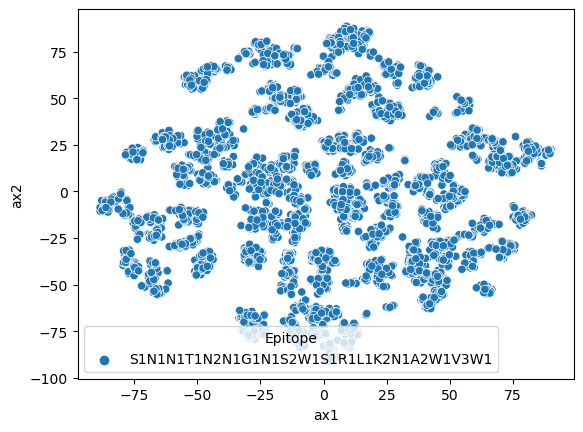

2YPV swa_1_vs_all_ig
Antigen 2YPV 
 {'Q1S1R2N1K2L1E1I1R2Q1I2L2I1T1Q1E2Q1H1G1L1': 6315, 'D1Q1S1R3N1K2L1E1R1Q1I2L2E1Q1D1I1G1L2A1': 269, 'T1D2Q1R1K1N1G1Q1E1D1I3A1H1G1H1G1L2A1L2': 99}


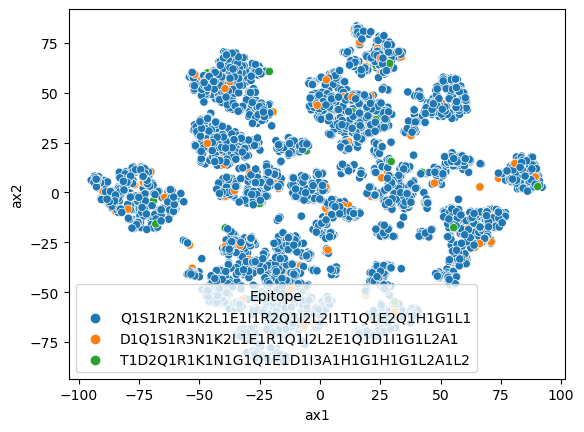

1OB1 swa_1_vs_all_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5055, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1760, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 98}


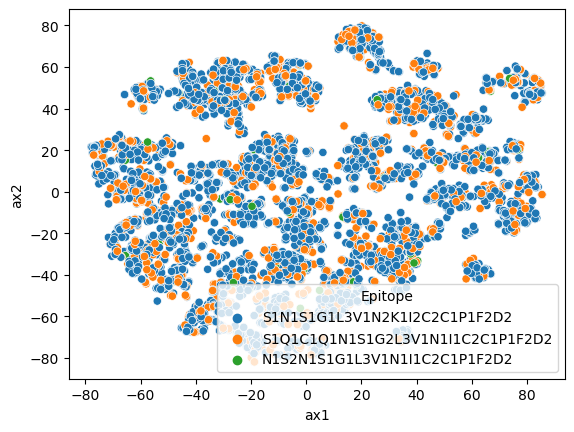

In [47]:
train_type = 'swa_1_vs_all_ig'

#find best replicate
df_perf = pd.read_csv(f'./closed_open_performance/{perf_file_name[train_type]}_full_perf.csv', index_col = 0)
df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
best_repl = df_perf[df_perf['test type'] == df_perf['trained on']].groupby('ag').max('acc')
    
for ag in antigens:
    best_repl_ag = int(best_repl.loc[ag]['repl'])
    #open IG predictions
    df_imp_pred = pd.read_csv(f'./IG/{ag}_{train_type}.txt', sep='\t', index_col = 0)
    #df_imp_pred = pd.read_csv(f'./logs/{ag}_swa_1_vs_all_ig.txt', sep='\t', converters = converter, index_col = 0)
    #df_imp_pred['full_deg_Slide'] = df_imp_pred['full_deg_Slide'].apply(eval)
    path_epi = glob.glob(f'../data/Slide_importance/{ag}_[A-Z]_Task4_Slice_ParaEpi.txt')[0]
    para_epi = pd.read_csv(path_epi, sep='\t')
    df_imp_pred = df_imp_pred.merge(para_epi, on=['Slide', 'Label', 'seqABParatope', 'AAcompoFullSlice'])
    print(f'{ag} {train_type}')
    tsne_clustering(df_imp_pred, best_repl_ag)

In [8]:
#converter = {f"1_vs_all_repl_{d}_ig": pd.eval for d in range(1,11)}
converter = {f"repl_{d}_ig": pd.eval for d in range(1,11)}

## old clusters

1OB1 swa_1_vs_all_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5133, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1783, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 100}


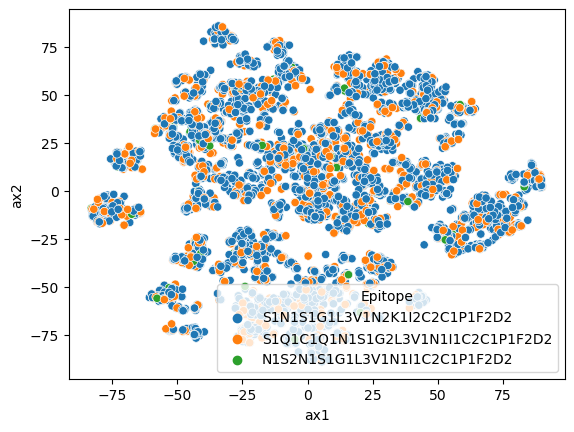

1OB1 base_1_vs_all_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5120, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1751, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 102}


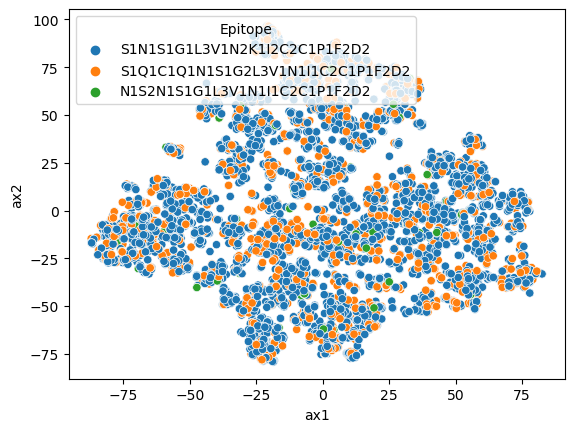

1OB1 swa_high_low_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5230, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1821, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 113}


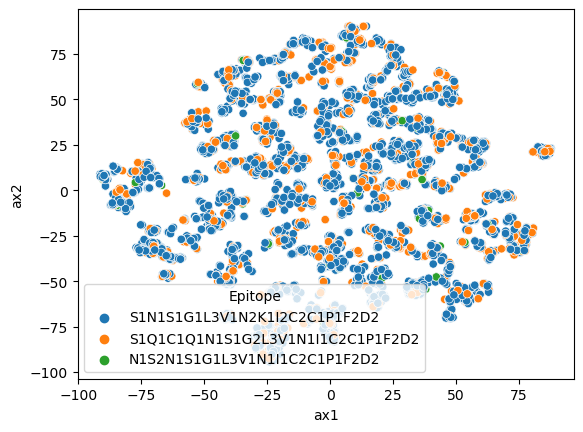

1OB1 swa_high_looser_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5009, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1757, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 83}


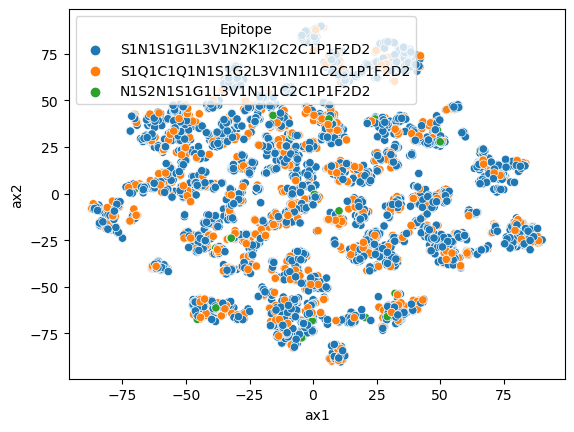

In [106]:
train_types = ['swa_1_vs_all_ig', 'base_1_vs_all_ig', 'swa_high_low_ig', 'swa_high_looser_ig']
#for ag in antigens:
ag = '1OB1'
for train_type in train_types:
    df_imp_pred = pd.read_csv(f'./logs/{ag}_{train_type}.txt', sep='\t', index_col = 0)
    #df_imp_pred = pd.read_csv(f'./logs/{ag}_swa_1_vs_all_ig.txt', sep='\t', converters = converter, index_col = 0)
    #df_imp_pred['full_deg_Slide'] = df_imp_pred['full_deg_Slide'].apply(eval)
    path_epi = glob.glob(f'../data/Slide_importance/{ag}_[A-Z]_Task4_Slice_ParaEpi.txt')[0]
    para_epi = pd.read_csv(path_epi, sep='\t')
    df_imp_pred = df_imp_pred.merge(para_epi, on=['Slide', 'Label', 'seqABParatope', 'AAcompoFullSlice'])
    print(f'{ag} {train_type}')
    tsne_clustering(df_imp_pred, 1)

1OB1 swa_1_vs_all_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5133, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1783, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 100}


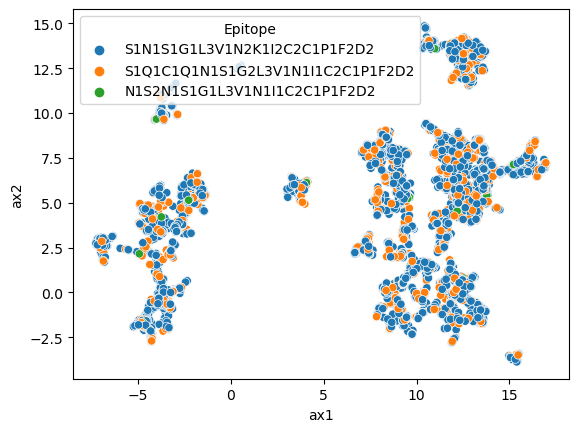

1OB1 base_1_vs_all_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5120, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1751, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 102}


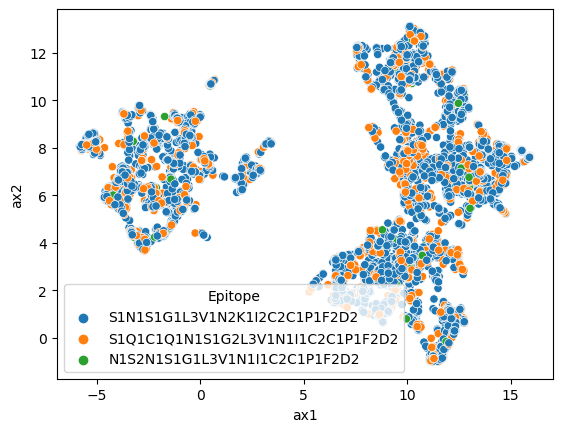

1OB1 swa_high_low_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5230, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1821, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 113}


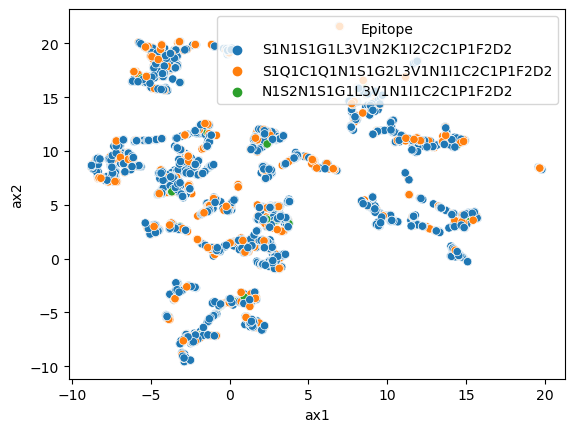

1OB1 swa_high_looser_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5009, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1757, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 83}


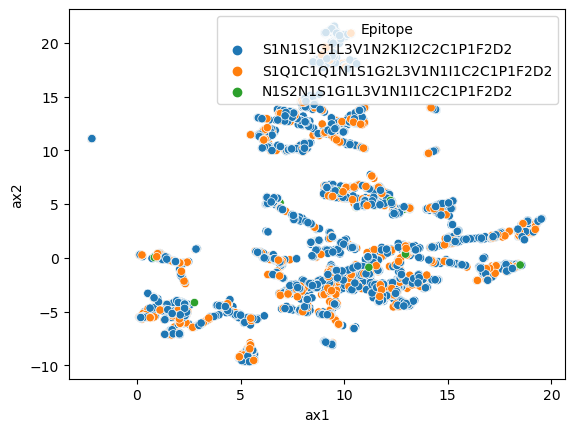

In [17]:
train_types = ['swa_1_vs_all_ig', 'base_1_vs_all_ig', 'swa_high_low_ig', 'swa_high_looser_ig']
#for ag in antigens:
ag = '1OB1'
for train_type in train_types:
    df_imp_pred = pd.read_csv(f'./logs/{ag}_{train_type}.txt', sep='\t', index_col = 0)
    #df_imp_pred = pd.read_csv(f'./logs/{ag}_swa_1_vs_all_ig.txt', sep='\t', converters = converter, index_col = 0)
    #df_imp_pred['full_deg_Slide'] = df_imp_pred['full_deg_Slide'].apply(eval)
    path_epi = glob.glob(f'../data/Slide_importance/{ag}_[A-Z]_Task4_Slice_ParaEpi.txt')[0]
    para_epi = pd.read_csv(path_epi, sep='\t')
    df_imp_pred = df_imp_pred.merge(para_epi, on=['Slide', 'Label', 'seqABParatope', 'AAcompoFullSlice'])
    print(f'{ag} {train_type}')
    umap_clustering(df_imp_pred, 1)

1OB1 swa_high_low_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5230, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1821, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 113}


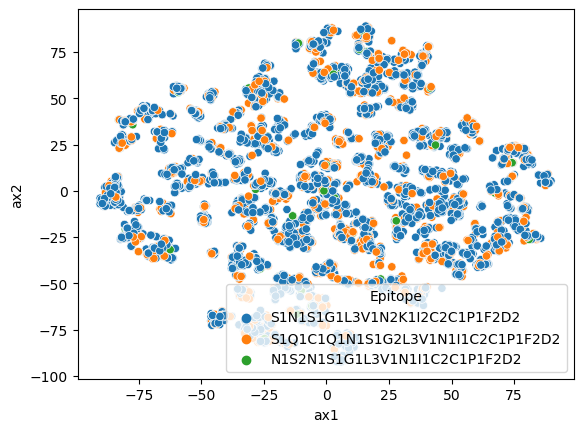

1OB1 swa_high_low_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5232, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1859, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 113}


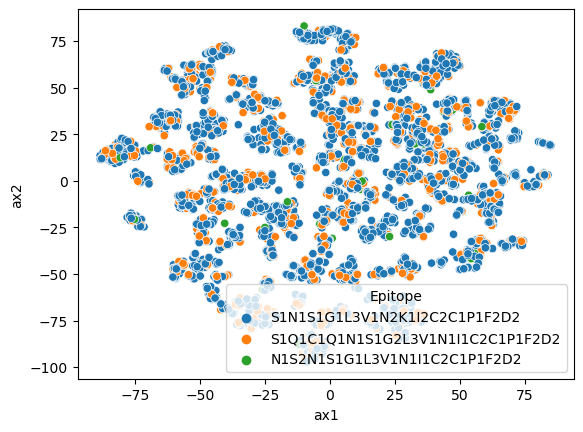

1OB1 swa_high_low_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5233, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1865, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 113}


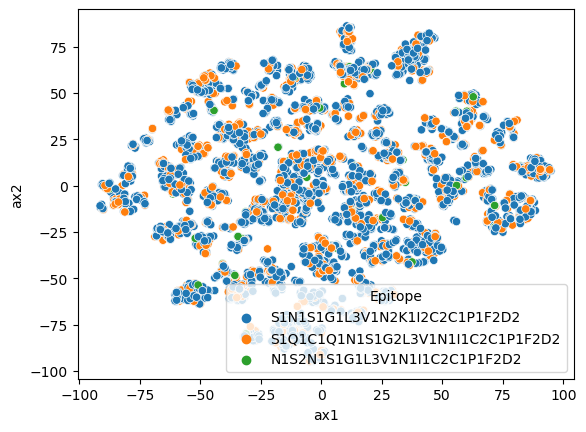

1OB1 swa_high_low_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5233, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1840, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 113}


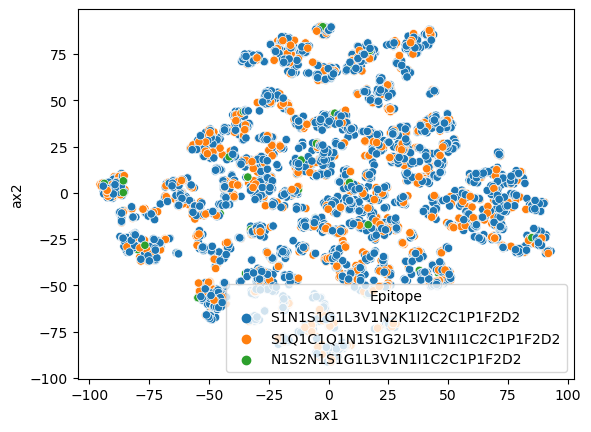

1OB1 swa_high_low_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5211, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1854, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 113}


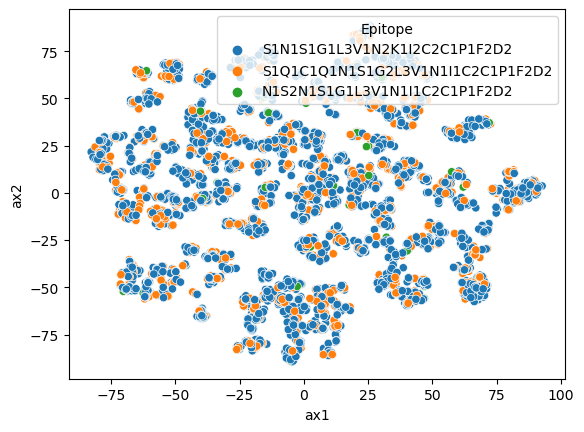

1OB1 swa_high_low_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5232, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1861, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 113}


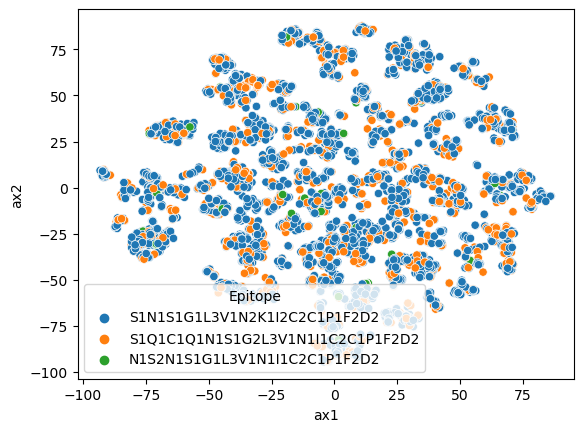

1OB1 swa_high_low_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5233, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1856, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 113}


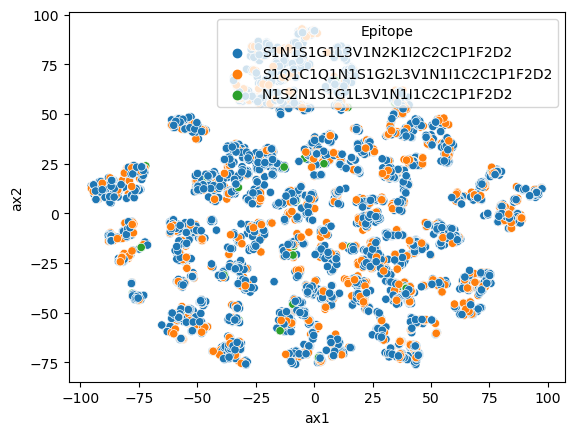

1OB1 swa_high_low_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5233, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1826, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 113}


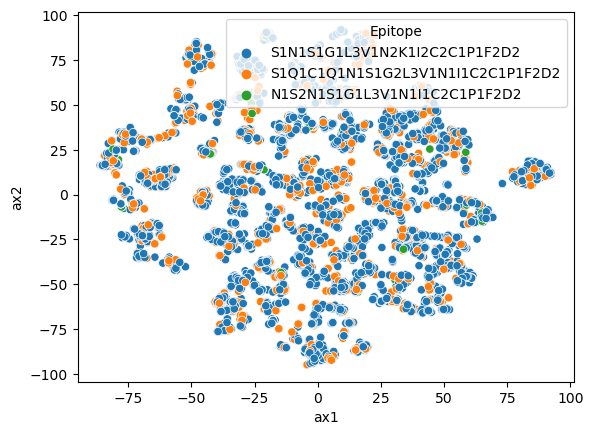

1OB1 swa_high_low_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5234, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1858, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 113}


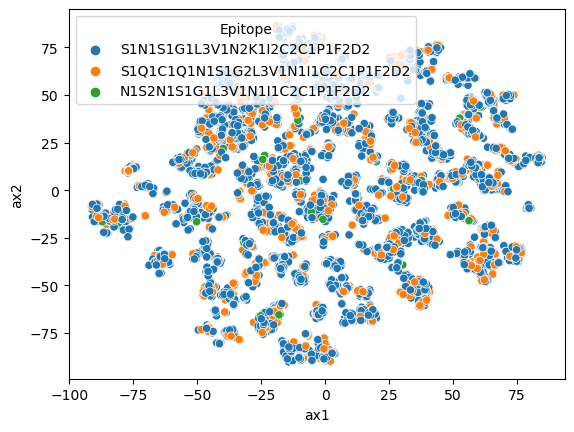

1OB1 swa_high_low_ig
Antigen 1OB1 
 {'S1N1S1G1L3V1N2K1I2C2C1P1F2D2': 5218, 'S1Q1C1Q1N1S1G2L3V1N1I1C2C1P1F2D2': 1796, 'N1S2N1S1G1L3V1N1I1C2C1P1F2D2': 113}


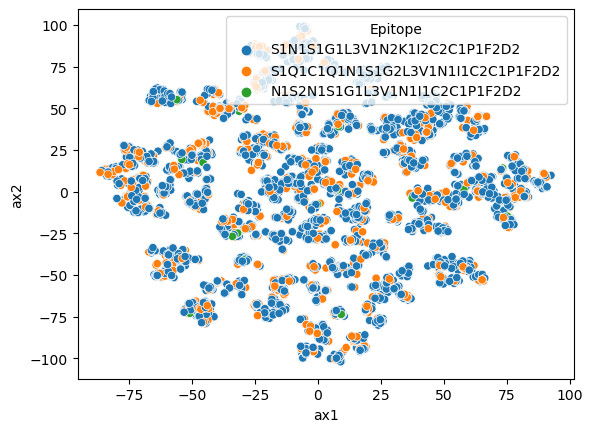

In [19]:
train_type = 'swa_high_low_ig'
#for ag in antigens:
ag = '3VRL'
for repl in range(1,11):
    df_imp_pred = pd.read_csv(f'./logs/{ag}_{train_type}.txt', sep='\t', index_col = 0)
    #df_imp_pred = pd.read_csv(f'./logs/{ag}_swa_1_vs_all_ig.txt', sep='\t', converters = converter, index_col = 0)
    #df_imp_pred['full_deg_Slide'] = df_imp_pred['full_deg_Slide'].apply(eval)
    path_epi = glob.glob(f'../data/Slide_importance/{ag}_[A-Z]_Task4_Slice_ParaEpi.txt')[0]
    para_epi = pd.read_csv(path_epi, sep='\t')
    df_imp_pred = df_imp_pred.merge(para_epi, on=['Slide', 'Label', 'seqABParatope', 'AAcompoFullSlice'])
    print(f'{ag} {train_type}')
    tsne_clustering(df_imp_pred, repl)

In [ ]:
#max and min attribition values for swa and base models
    

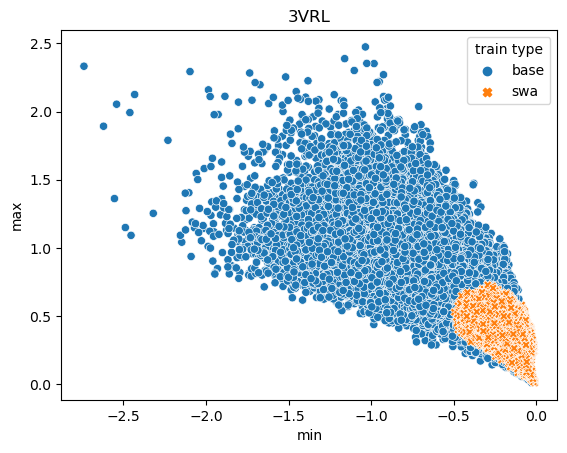

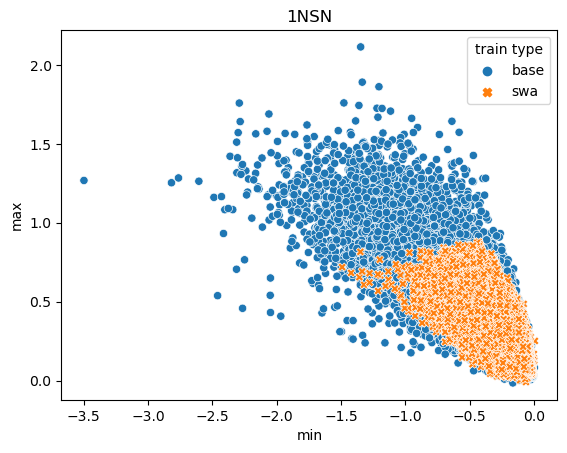

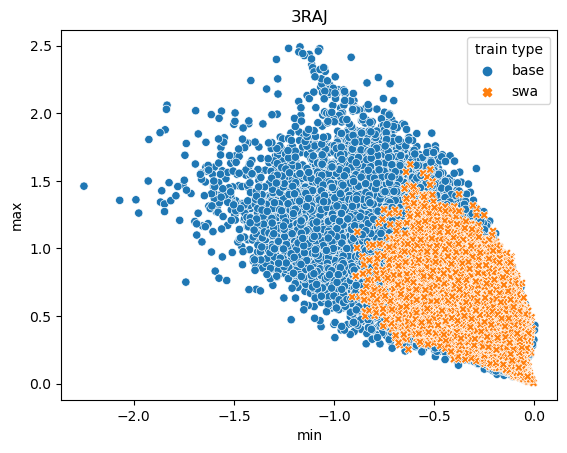

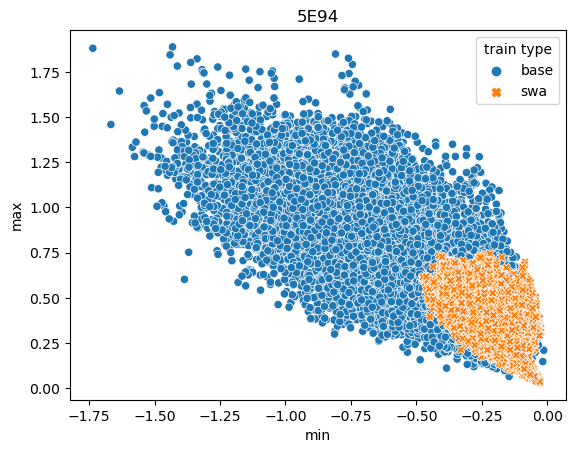

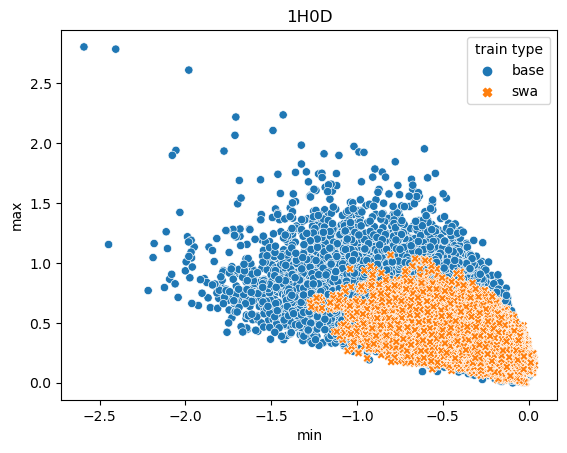

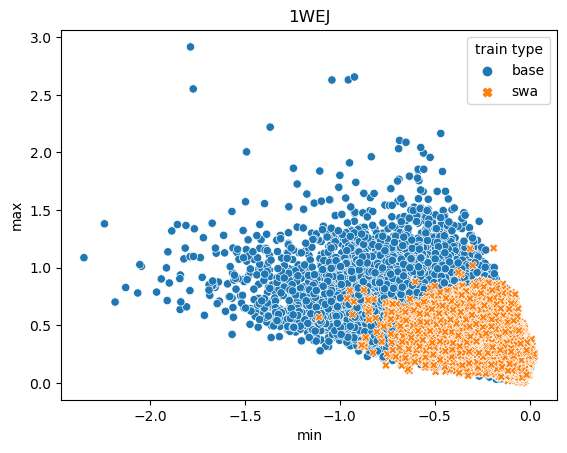

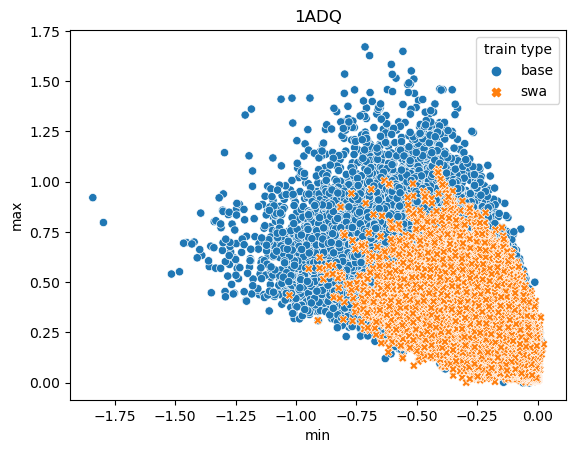

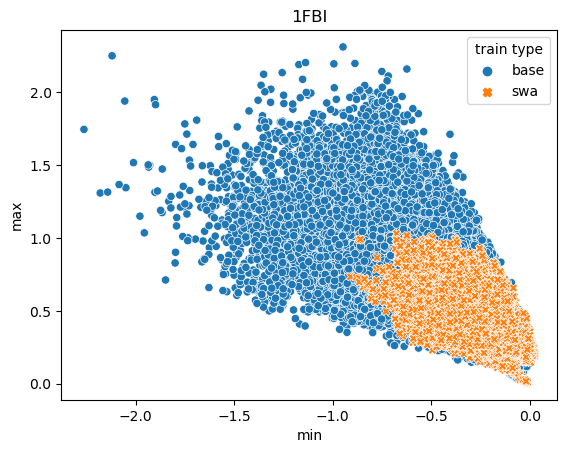

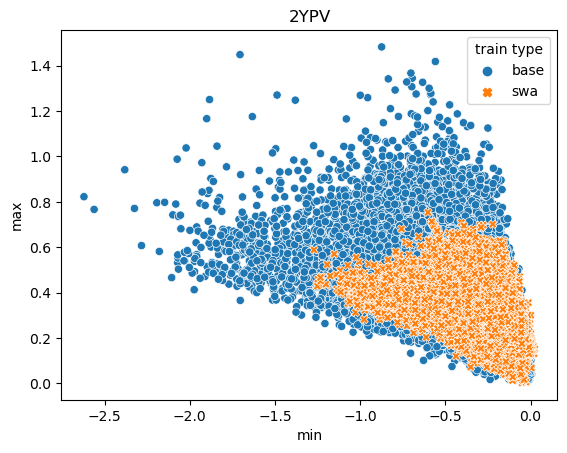

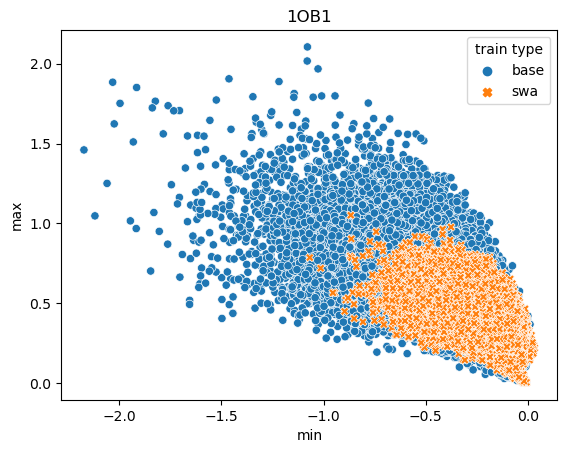

In [62]:
for ag in antigens:
    df_imp_swa = pd.read_csv(f'./logs/{ag}_swa_1_vs_all_ig.txt', sep='\t', index_col = 0, converters=converter)
    df_ig_swa = df_imp_swa.filter(regex=("1_vs_all_repl_\d*_ig"))
    df_swa =pd.DataFrame(df_ig_swa.values.reshape(-1,1), columns = ['ig'])
    df_swa['min'] = df_swa['ig'].apply(min)
    df_swa['max'] = df_swa['ig'].apply(max)
    df_swa['train type'] = ['swa']*df_swa.shape[0]
    
    df_imp_base = pd.read_csv(f'./logs/{ag}_base_1_vs_all_ig.txt', sep='\t', index_col = 0, converters=converter)
    df_ig_base = df_imp_base.filter(regex=("1_vs_all_repl_\d*_ig"))
    df_base =pd.DataFrame(df_ig_base .values.reshape(-1,1), columns = ['ig'])
    df_base['min'] = df_base['ig'].apply(min)
    df_base['max'] = df_base['ig'].apply(max)
    df_base['train type'] = ['base']*df_base.shape[0]
    df = pd.concat([df_base, df_swa])
    print()
    sns.scatterplot(df, x = 'min', y='max', hue = 'train type', style = 'train type')
    plt.title(ag)
    plt.show()

In [ ]:
#models are bad...
#how to improve models?

In [ ]:
#plotting degree vs ig value

In [77]:
df_imp_pred = pd.read_csv(f'./logs/1ADQ_swa_1_vs_all_ig.txt', sep='\t', index_col = 0, converters= converter)
df_imp_pred['degrees'] = df_imp_pred['full_deg_Slide'].apply(lambda x: re.findall('\d',x))
ex_df['degrees'] = ex_df['degrees'].apply(lambda x: np.array(x).astype(int))

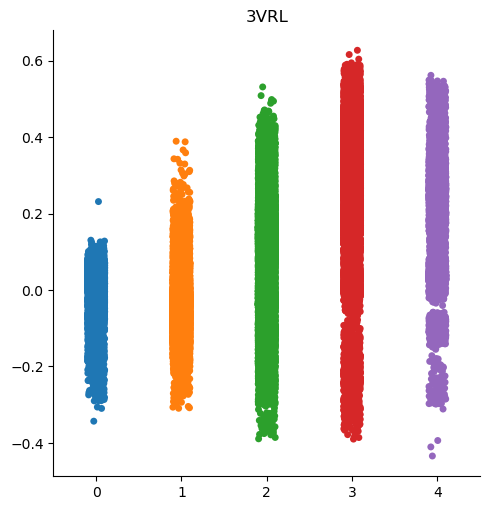

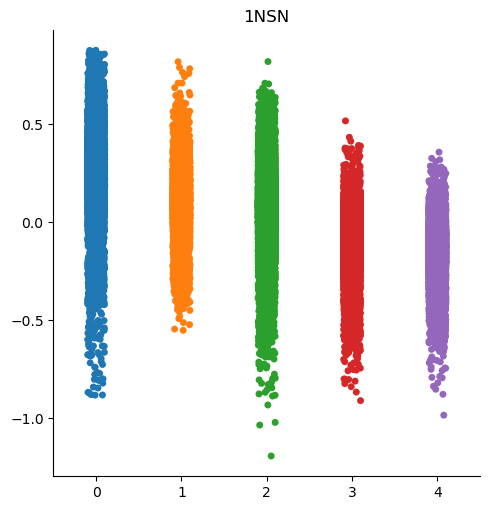

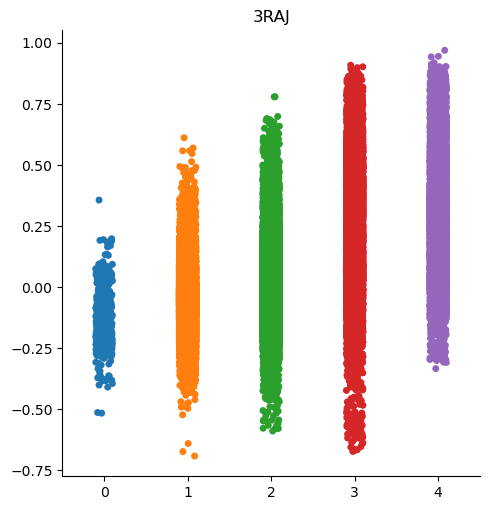

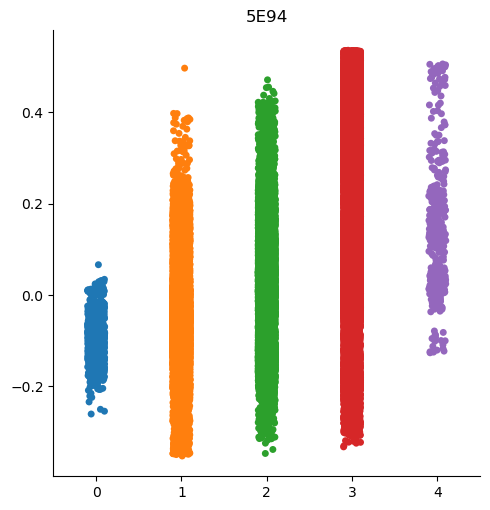

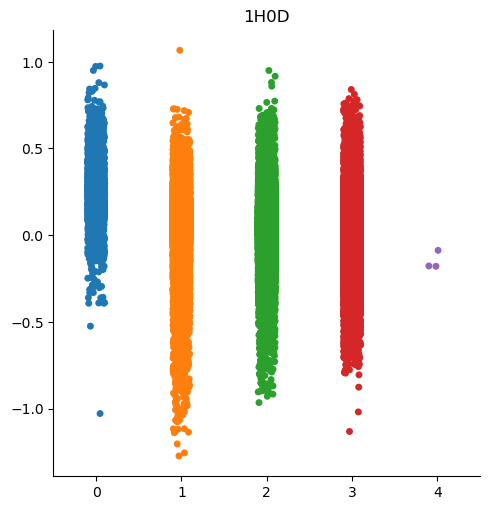

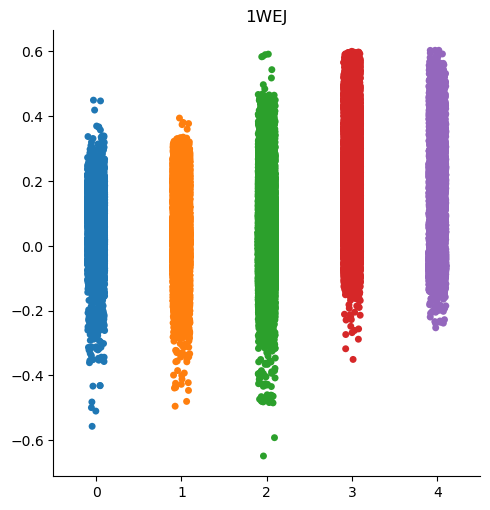

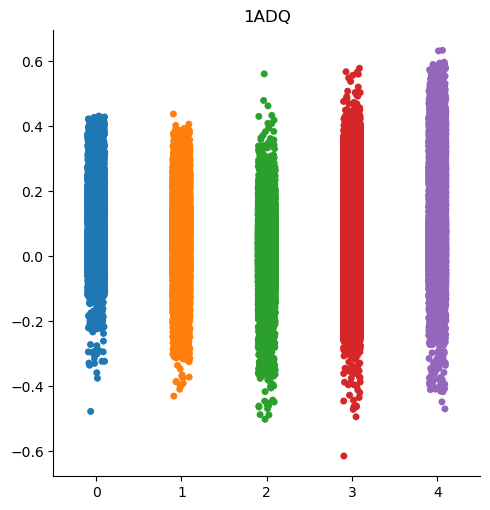

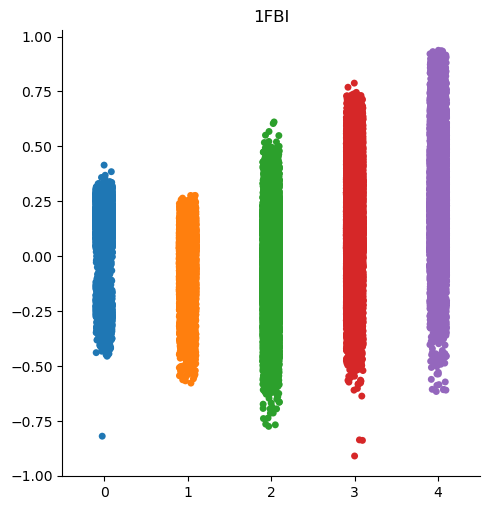

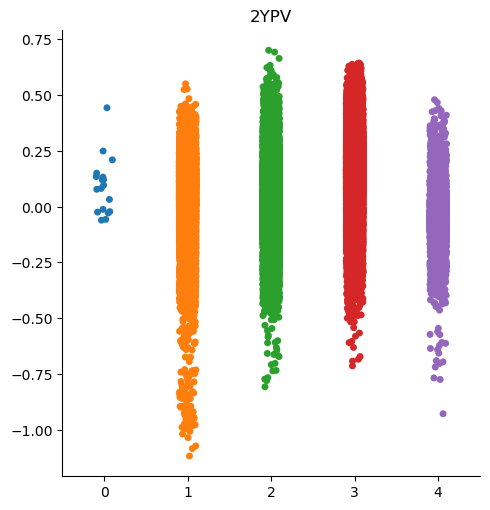

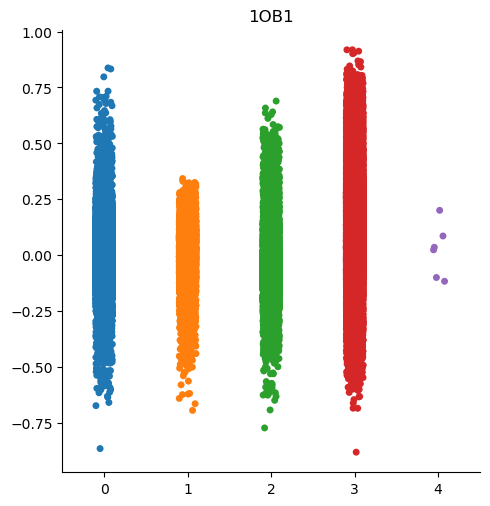

In [178]:
for ag in antigens:
    df_degree = pd.read_csv(f'./logs/{ag}_swa_1_vs_all_ig.txt', sep='\t', index_col = 0, converters= converter)
    df_degree['degrees'] = df_degree['full_deg_Slide'].apply(lambda x: re.findall('\d',x))
    df_degree['degrees'] = df_degree['degrees'].apply(lambda x: np.array(x).astype(int))
    degree_dict = dict()
    for degree in range(5):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            masks = df_degree['degrees'].apply(lambda x: x == degree)
            df_degree['mask'] = masks
            attr_lists = df_degree.apply(lambda x: np.array(x['1_vs_all_repl_1_ig'])[x['mask']].tolist(), axis=1)
            degree_dict[degree] = sum([*attr_lists], [])
    sns.catplot(degree_dict)
    plt.title(ag)
    plt.show()